In [512]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import time

# Let’s Get Blurry

## 1.1

In [513]:
def conv2D(img,kernel):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2
    
    padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=0)
    
    windows = np.lib.stride_tricks.sliding_window_view(padded_img, (kernel_h, kernel_w))
    
    output_img = np.einsum('ijkl,kl->ij', windows, kernel)
        
    return output_img

## 1.2

In [514]:
def meanFilter(img,k=5):
    """Apply a mean filter of size k x k to the input image."""
    # Convert image to float
    img = img.astype(np.float32)
    
    # Generate the mean filter kernel of size k x k
    kernel = np.ones((k, k)) / (k * k)
    # Convolve the image with the mean filter kernel
    img_out = conv2D(img,kernel)

    # Clip between 0 to 255
    img_out = np.clip(img_out,0,255)
    img_out = img_out.astype(np.uint8)
    return img_out

In [515]:
def MeanFilter(img,k):
    """Function to convolve a 2D image with a 2D kernel of size k*k. The image is padded with zeros to maintain the size of the image."""
    # Get the dimensions of image and kernel
    img_h,img_w = img.shape
    kernel_h,kernel_w = k,k

    # Ensure kernel dimensions are odd to get symmetric padding
    assert kernel_h%2 == 1 and kernel_w%2 == 1, "Kernel dimensions should be odd."

    # Compute padding sizes
    pad_h = kernel_h//2
    pad_w = kernel_w//2

    # Create mean kernel
    kernel = np.ones((kernel_h, kernel_w)) / (kernel_h * kernel_w)

    # Pad the image with zeros
    img_pad = np.pad(img,((pad_h,pad_h),(pad_w,pad_w)),'constant',constant_values=0)

    # Initialize the output image
    img_out = np.zeros_like(img)

    # Convolve the image with the kernel
    for i in range(img_h):
        for j in range(img_w):
            # Extract the region of interest
            region = img_pad[i:i + kernel_h, j:j + kernel_w]
            # Element-wise multiplication and summation
            img_out[i, j] = np.sum(region * kernel)
    
    # Clip
    img_out = np.clip(img_out,0,255)
    img_out = img_out.astype(np.uint8)
    return img_out

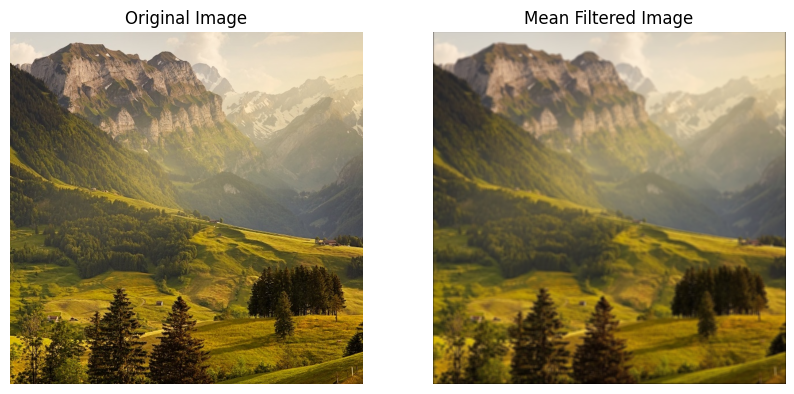

In [516]:
# Read image and apply mean filtering
img = cv2.imread('../images/IMG1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Separate the color channels using numpy indexing
R = img[:, :, 0]
G = img[:, :, 1]
B = img[:, :, 2]

# Apply the mean filter to each channel
R_filtered = meanFilter(R, k=5)
G_filtered = meanFilter(G, k=5)
B_filtered = meanFilter(B, k=5)

# Stack the filtered channels back into a color image
img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

# Display the original and filtered images
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(img_out)
plt.title('Mean Filtered Image')    
plt.axis('off')
plt.show()

## 1.3

In [517]:
def medianFilter(img,k=5):
    """Apply a median filter of size k x k to the input image."""
    # Get the dimensions of the image
    img_h,img_w = img.shape

    # Ensure kernel dimensions are odd to get symmetric padding
    assert k%2 == 1, "Kernel dimensions should be odd."

    # Compute padding sizes
    pad = k//2

    # Pad the image with zeros
    img_pad = np.pad(img,((pad,pad),(pad,pad)),'constant',constant_values=0)

    # Initialize the output image
    img_out = np.zeros_like(img)

    # Convolve the image with the kernel
    for i in range(img_h):
        for j in range(img_w):
            # Extract the region of interest
            region = img_pad[i : i + k , j: j + k] 
            # Compute the median of the region
            img_out[i, j] = np.median(region)
    
    # Clip output image
    img_out = np.clip(img_out,0,255)
    img_out = img_out.astype(np.uint8)
    return img_out    

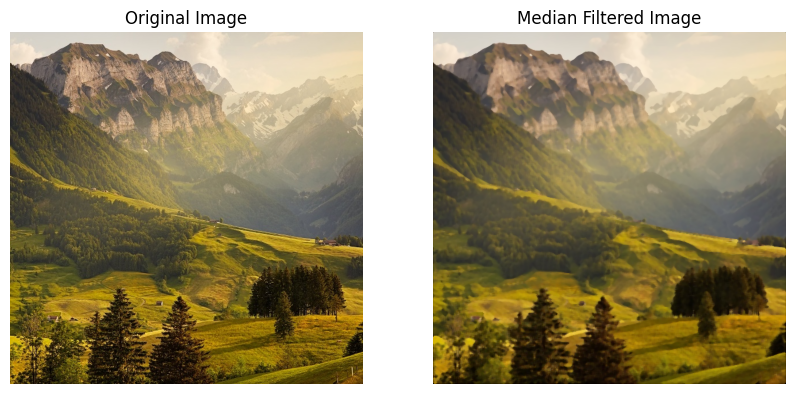

In [518]:
# Read image and apply mean filtering
img = cv2.imread('../images/IMG1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Separate the color channels using numpy indexing
R = img[:, :, 0]
G = img[:, :, 1]
B = img[:, :, 2]

# Apply the mean filter to each channel
R_filtered = medianFilter(R, k=5)
G_filtered = medianFilter(G, k=5)
B_filtered = medianFilter(B, k=5)

# Stack the filtered channels back into a color image
img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

# Display the original and filtered images
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(img_out)
plt.title('Median Filtered Image')
plt.axis('off')
plt.show()

## 1.4

In [519]:
def measure_time(filter_function, img, k):
    start_time = time.time()
    filter_function(img, k)
    end_time = time.time()
    return end_time - start_time

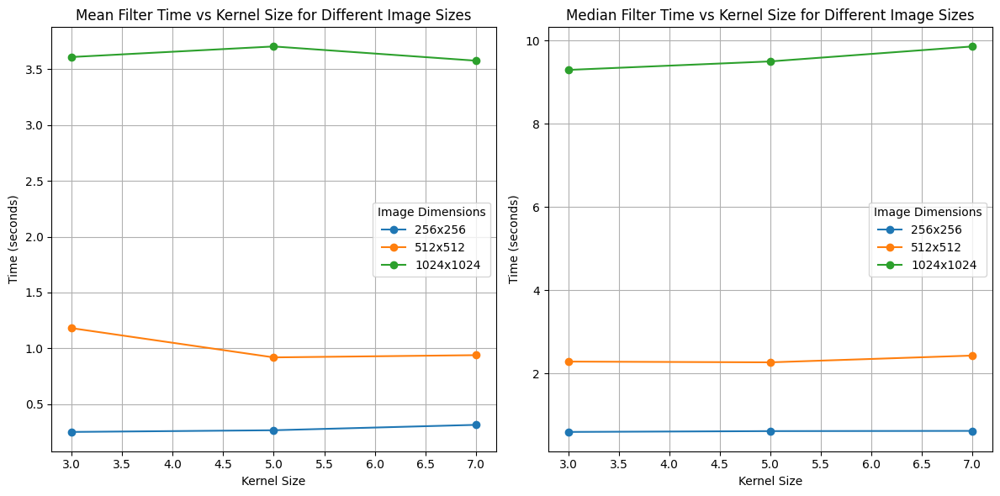

In [520]:
# Image dimensions and kernel sizes to test
image_dims = [(256, 256), (512, 512), (1024, 1024)]
kernel_sizes = [3, 5, 7]

# Read a base image and create different sizes
base_img = cv2.imread('../images/IMG1.jpg')
base_img = cv2.cvtColor(base_img, cv2.COLOR_BGR2GRAY)

# Prepare to plot
plt.figure(figsize=(12, 6))

# Plot mean filter time vs kernel size for different image sizes
plt.subplot(1, 2, 1)
for img_dim in image_dims:
    img_resized = cv2.resize(base_img, img_dim)

    mean_times = []

    for k in kernel_sizes:
        mean_time = measure_time(MeanFilter, img_resized, k)        
        mean_times.append(mean_time)

    plt.plot(kernel_sizes, mean_times, marker='o', label=f'{img_dim[0]}x{img_dim[1]}')

plt.title('Mean Filter Time vs Kernel Size for Different Image Sizes')
plt.xlabel('Kernel Size')
plt.ylabel('Time (seconds)')
plt.grid(True)
plt.legend(title='Image Dimensions')

# PLot median filter time vs kernel size for different image sizes
plt.subplot(1, 2, 2)
for img_dim in image_dims:
    img_resized = cv2.resize(base_img, img_dim)

    median_times = []

    for k in kernel_sizes:
        median_time = measure_time(medianFilter, img_resized, k)        
        median_times.append(median_time)

    plt.plot(kernel_sizes, median_times, marker='o', label=f'{img_dim[0]}x{img_dim[1]}')

plt.title('Median Filter Time vs Kernel Size for Different Image Sizes')
plt.xlabel('Kernel Size')
plt.ylabel('Time (seconds)')
plt.grid(True)
plt.legend(title='Image Dimensions')

plt.tight_layout()
plt.show()


### Comment your observation
- From the above graph, we can see that for mean filter, as the dimensions of the image increases, the time for filtering also significantly increases.
- Likewise, within the same image dimensions, as the kernel size increases the time for filtering also increases as the window size and computation time for each window increases.
- For the median filter, we observe that as image dimensions increase, filtering time also increases.
- However, in case of median filters, the kernel size is not creating a significant difference due to the use of np.median which is a vectorised operation.
- Also, median filter is more time consuming than mean filter due to heavier computation in median filter involving sorting and finding the middle value.

## 1.5

In [521]:
# Efficient meanFilter using integral images
def fastMeanFilter(img, k):
    """Here we compute integral image where each pixel is cumulative sum of all pixels above and to the left of it"""
    img_height, img_width = img.shape
    pad_size = k // 2

    # Create padded image
    padded_img = np.pad(img, ((pad_size, pad_size), (pad_size, pad_size)), mode='constant', constant_values=0)

    # Compute integral image
    integral_img = np.cumsum(np.cumsum(padded_img, axis=0), axis=1).astype(np.float64)

    output_img = np.zeros_like(img, dtype=np.float64)

    # Calculate sum for each window using the integral image
    for i in range(img_height):
        for j in range(img_width):
            x1, y1 = i, j
            x2, y2 = i + k - 1, j + k - 1
            
            A = integral_img[x1-1, y1-1] if x1 > 0 and y1 > 0 else 0
            B = integral_img[x1-1, y2] if x1 > 0 else 0
            C = integral_img[x2, y1-1] if y1 > 0 else 0
            D = integral_img[x2, y2]
            
            window_sum = D - B - C + A
            output_img[i, j] = window_sum / (k * k)
        
    # Clip the values to the range [0, 255] and convert to uint8
    output_img = np.clip(output_img, 0, 255).astype(np.uint8)    
    return output_img

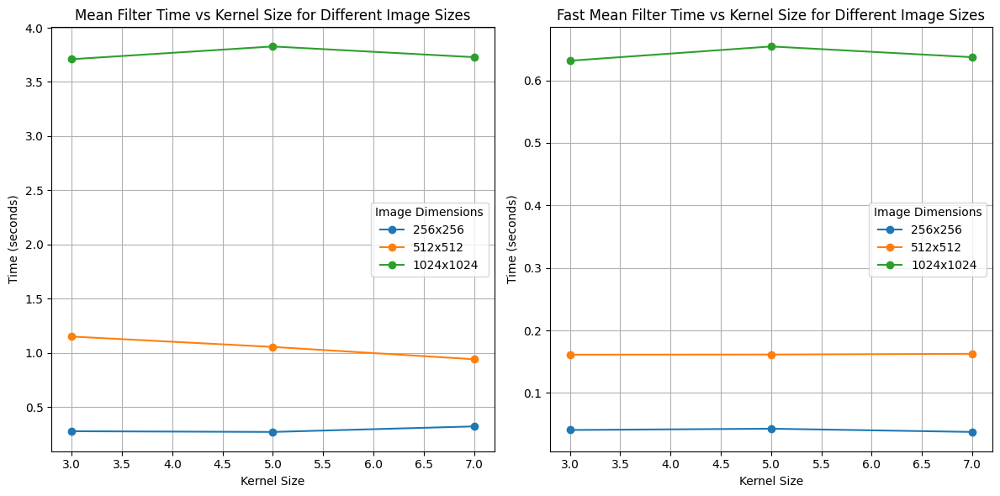

In [522]:
# Image dimensions and kernel sizes to test
image_dims = [(256, 256), (512, 512), (1024, 1024)]
kernel_sizes = [3, 5, 7]

# Read a base image and create different sizes
base_img = cv2.imread('../images/IMG1.jpg')
base_img = cv2.cvtColor(base_img, cv2.COLOR_BGR2GRAY)

# Prepare to plot
plt.figure(figsize=(12, 6))

# Plot mean filter time vs kernel size for different image sizes
plt.subplot(1, 2, 1)
for img_dim in image_dims:
    img_resized = cv2.resize(base_img, img_dim)

    mean_times = []

    for k in kernel_sizes:
        mean_time = measure_time(MeanFilter, img_resized, k)        
        mean_times.append(mean_time)

    plt.plot(kernel_sizes, mean_times, marker='o', label=f'{img_dim[0]}x{img_dim[1]}')

plt.title('Mean Filter Time vs Kernel Size for Different Image Sizes')
plt.xlabel('Kernel Size')
plt.ylabel('Time (seconds)')
plt.grid(True)
plt.legend(title='Image Dimensions')

# PLot median filter time vs kernel size for different image sizes
plt.subplot(1, 2, 2)
for img_dim in image_dims:
    img_resized = cv2.resize(base_img, img_dim)

    fast_mean_times = []

    for k in kernel_sizes:
        fast_mean_time = measure_time(fastMeanFilter, img_resized, k)        
        fast_mean_times.append(fast_mean_time)

    plt.plot(kernel_sizes, fast_mean_times, marker='o', label=f'{img_dim[0]}x{img_dim[1]}')

plt.title('Fast Mean Filter Time vs Kernel Size for Different Image Sizes')
plt.xlabel('Kernel Size')
plt.ylabel('Time (seconds)')
plt.grid(True)
plt.legend(title='Image Dimensions')

plt.tight_layout()
plt.show()


### Comment on your observations
- For fastMeanFilter, we compute the itegral image of our input image. Integral image uses the ideas of dynamic programming where each cell stores the sum of all pixel intensities above and left to it. This way we need not compute repeated sums as highlighted in the question.
- As we can see in the above plot, if the mean filter takes 3 s, the fastMeanFilter takes around 0.65 seconds.
- Thus this method is very efficient especially for higher dimension images.
- For lower dimension images like 256 * 256, we can see the time goes from 0.25 to 0.05 which is definitely an improvement but not as prominent as in case of 1024 * 1024.

# Distribution is the Solution

## 2.1

In [523]:
def generateGaussianKernel(k, sigma):
    # Ensure the filter size is odd to have a center pixel
    if k % 2 == 0:
        raise ValueError("Filter size k must be odd.")
    
    # Compute the center of the kernel
    center = k // 2
    gaussian_filter = np.zeros((k, k))

    for i in range(k):
        for j in range(k):
            gaussian_filter[i, j] = (1/(2*np.pi*sigma**2)) * np.exp(-((i - center)**2 + (j - center)**2) / (2 * sigma**2))
    
    return gaussian_filter


In [524]:
def gaussFilter(img, sigma, k=7):
    """Takes in, a 2D image, kernel size, sigma and generates the Gaussian kernel and filters the image"""
    # Convert image to float
    img = img.astype(np.float32)
    
    # Generate gaussian kernel
    kernel = generateGaussianKernel(k, sigma)

    # Normalize the kernel
    kernel = kernel / np.sum(kernel)

    # Convolve the image with the kernel
    img_out = conv2D(img, kernel)

    # Clip the values to the range [0, 255] and convert to uint8
    img_out = np.clip(img_out, 0, 255).astype(np.uint8)
    return img_out    

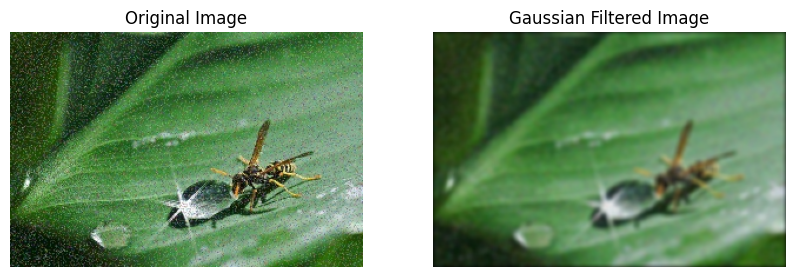

In [525]:
# Read image and apply gaussian filtering
img = cv2.imread('../images/IMG2.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Separate the color channels using numpy indexing
R = img[:, :, 0]
G = img[:, :, 1]
B = img[:, :, 2]

# Apply the Gaussian filter to each channel
R_filtered = gaussFilter(R, sigma=2, k=7)
G_filtered = gaussFilter(G, sigma=2, k=7)
B_filtered = gaussFilter(B, sigma=2, k=7)

# Stack the filtered channels back into a color image
img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

# Display the original and filtered images
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(img_out)
plt.title('Gaussian Filtered Image')
plt.axis('off')
plt.show()

## 2.2

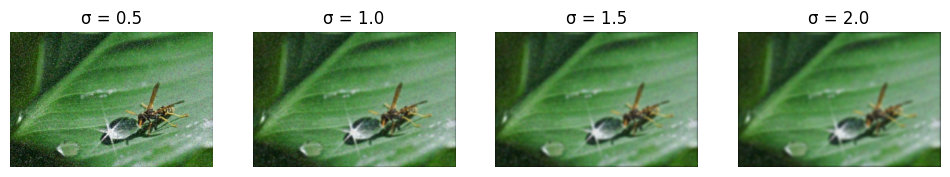

In [526]:
def plot_gaussian_results(img, k=7, sigmas=[0.5, 1.0, 1.5, 2.0]):

    # Separate the color channels using numpy indexing
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    plt.figure(figsize=(12, 8))
    
    for i, sigma in enumerate(sigmas):
        R_filtered = gaussFilter(R, sigma, k)
        G_filtered = gaussFilter(G, sigma, k)
        B_filtered = gaussFilter(B, sigma, k)

        # Stack the filtered channels back into a color image
        filtered_img = np.stack([R_filtered, G_filtered, B_filtered], axis=2)
        
        plt.subplot(1, len(sigmas), i + 1)
        plt.imshow(filtered_img)
        plt.title(f'σ = {sigma}')
        plt.axis('off')
    
    plt.show()
    
plot_gaussian_results(img, k=7, sigmas=[0.5, 1.0, 1.5, 2.0])

Optimal Sigma: 1.0
Area: 0.9994587918263369


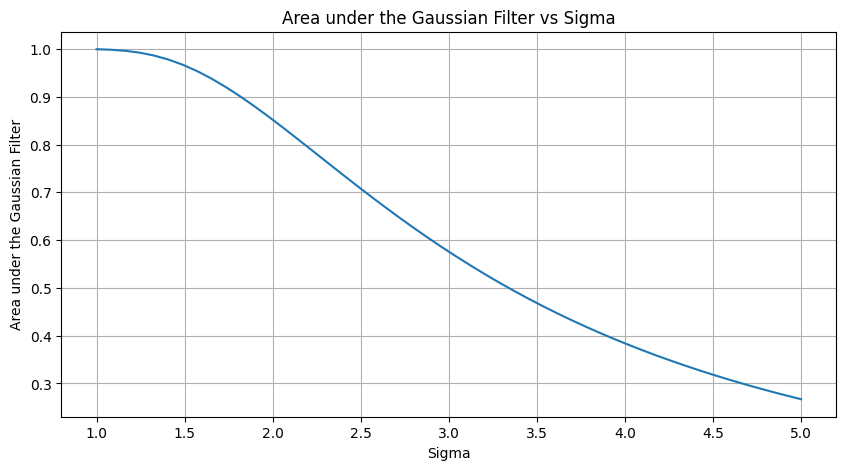

In [527]:
def findOptimalSigma():
    """Function to find the optimal sigma value for the Gaussian filter. Also plot areas for different sigma values."""
    k = 7
    sigma_values = np.linspace(1, 5, 50)
    area_values = []

    for sigma in sigma_values:
        filter = generateGaussianKernel(k, sigma)

        # Compute the area of the filtered image
        area = np.sum(filter)
        area_values.append(area)

    # Find the optimal sigma value
    optimal_sigma = sigma_values[np.argmax(area_values)]
    print(f'Optimal Sigma: {optimal_sigma}')
    print(f'Area: {max(area_values)}')

    # Plot the area values
    plt.figure(figsize=(10, 5))
    plt.plot(sigma_values, area_values)
    plt.xlabel('Sigma')
    plt.ylabel('Area under the Gaussian Filter')
    plt.title('Area under the Gaussian Filter vs Sigma')
    plt.grid(True)
    plt.show()    

findOptimalSigma()

### Theory
- We know that for gaussian distribution the optimal kernel size for representing the gaussian is 6*sigma. Thus for k=7, the sigma which can be efficiently covered is 7/6 which is nearly equal to 1.
- Thus the optimal value for sigma (for kernel size 7) is **1.0** which covers an area of **99.94%**.

## 2.3

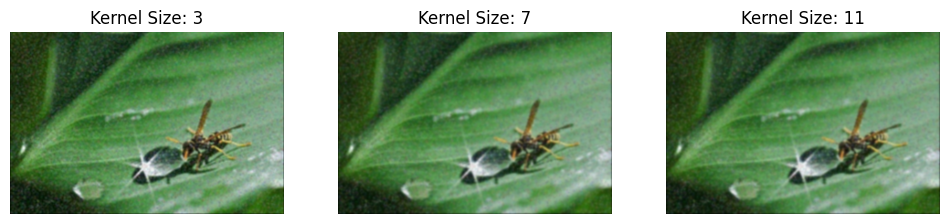

In [528]:
def varyKernelSize():
    """Vary kernel size and plot the results."""
    img = cv2.imread('../images/IMG2.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Separate the color channels using numpy indexing
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]
        
    kernel_sizes = [3, 7, 11]

    # Filter the image with different kernel sizes and plot in same plot using subplots
    plt.figure(figsize=(12, 6))
    for k in kernel_sizes:
        # Apply the Gaussian filter to each channel
        R_filtered = gaussFilter(R, sigma=1, k=k)
        G_filtered = gaussFilter(G, sigma=1, k=k)
        B_filtered = gaussFilter(B, sigma=1, k=k)

        # Stack the filtered channels back into a color image
        img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

        plt.subplot(1, len(kernel_sizes), kernel_sizes.index(k) + 1)
        plt.imshow(img_out, cmap='gray')
        plt.title(f'Kernel Size: {k}')
        plt.axis('off')
    plt.show()

varyKernelSize()    

### Effect of k
- **Small Kernel**: A smaller kernel, like 3×3, will have a limited blurring effect, mostly affecting the immediate neighborhood.
- **Larger Kernels**: As the kernel size increases, the blurring effect becomes more pronounced, affecting a larger area around each pixel.

### Effect of sigma
- **Small sigma**: The filter will act as a low-pass filter, only slightly blurring the image, preserving fine details.
- **Large sigma**: The filter will result in a stronger blur, removing noise as well as fine details.

For a fixed kernel size k=7, an optimal sigma value will include most of the Gaussian distribution’s area, ensuring that we get a good balance between noise reduction and detail preservation.

## 2.4

In [529]:
def bilaterFilter(img, k, sigma_s, sigma_r):
    """Apply bilateral filter on image"""
    if k % 2 == 0:
        raise ValueError("Kernel size k must be odd.")
    
    # Convert to float32
    img = img.astype(np.float32)
    
    half_k = k // 2
    height,width = img.shape

    # Generate spatial kernel
    spatial_kernel = generateGaussianKernel(k, sigma_s)
    spatial_kernel = spatial_kernel / np.sum(spatial_kernel)
    
    # Initialize output image
    img_out = np.zeros_like(img)
    
    # Pad the image
    img_pad = np.pad(img, ((half_k, half_k), (half_k, half_k)), mode='edge')
    
    # Apply bilateral filter
    for i in range(height):
        for j in range(width):
            # Extract local region
            region = img_pad[i:i+k, j:j+k]

            # Compute center pixel
            center_pixel = img_pad[i + half_k, j + half_k]
            
            # Compute intensity kernel
            range_kernel = (1/(2*np.pi*sigma_r**2)) * np.exp(-0.5 * (region - center_pixel) ** 2 / sigma_r ** 2)
            
            # Combine spatial and range kernels
            combined_kernel = spatial_kernel * range_kernel
            
            # Normalize kernel
            combined_kernel_sum = np.sum(combined_kernel)
            
            # Apply filter
            img_out[i, j] = np.sum(region * combined_kernel)/combined_kernel_sum if combined_kernel_sum != 0 else center_pixel
    
    # Clip to come between 0 to 255 and convert to uint8
    img_out = np.clip(img_out, 0, 255)
    img_out = img_out.astype(np.uint8)      
    return img_out

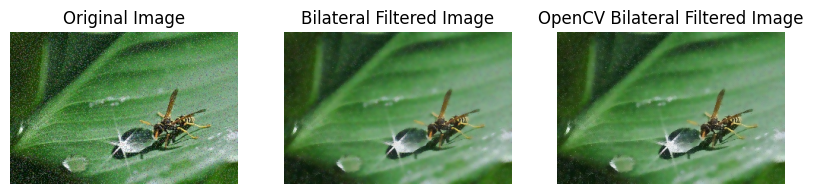

In [530]:
def applyBilateralFilter():
    """Apply bilateral filter to image"""
    # Read image
    img = cv2.imread('../images/IMG2.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Separate the color channels using numpy indexing
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply the bilateral filter to each channel
    R_filtered = bilaterFilter(R, k=7, sigma_s=2, sigma_r=50)
    G_filtered = bilaterFilter(G, k=7, sigma_s=2, sigma_r=50)
    B_filtered = bilaterFilter(B, k=7, sigma_s=2, sigma_r=50)

    # Stack the filtered channels back into a color image
    img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

    # Display the original and filtered images
    plt.figure(figsize=(10,10))
    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(img_out)
    plt.title('Bilateral Filtered Image')
    plt.axis('off')

    img = img.astype(np.float32)
    filtered_img = cv2.bilateralFilter(img, d=7, sigmaColor=100, sigmaSpace=5)
    filtered_img = filtered_img.clip(0, 255)
    filtered_img = filtered_img.astype(np.uint8)
    plt.subplot(1,3,3)
    plt.imshow(filtered_img)
    plt.title('OpenCV Bilateral Filtered Image')
    plt.axis('off')

    plt.show()

applyBilateralFilter()

## 2.5

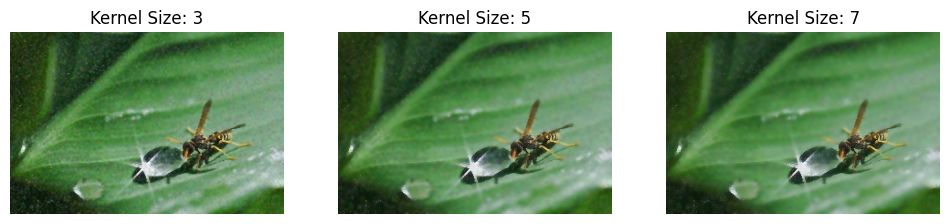

In [531]:
def varykBilater():
    """Perform filtering for different values of k and compare results"""
    img = cv2.imread('../images/IMG2.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Separate the color channels using numpy indexing
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]
        
    kernel_sizes = [3,5,7]

    # Filter the image with different kernel sizes and plot in same plot using subplots
    plt.figure(figsize=(12, 6))

    for k in kernel_sizes:
        # Apply the Gaussian filter to each channel
        R_filtered = bilaterFilter(R,k=k,sigma_s=2,sigma_r=50)
        G_filtered = bilaterFilter(G, k=k,sigma_s=2,sigma_r=50)
        B_filtered = bilaterFilter(B, k=k,sigma_s=2,sigma_r=50)

        # Stack the filtered channels back into a color image
        img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)
        plt.subplot(1, len(kernel_sizes), kernel_sizes.index(k) + 1)
        plt.imshow(img_out)
        plt.title(f'Kernel Size: {k}')
        plt.axis('off')
    plt.show()
varykBilater()       


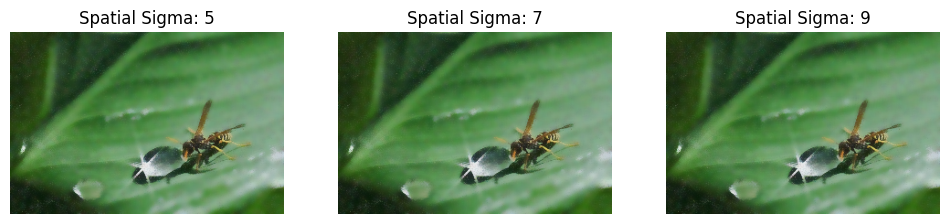

In [532]:
def varySigmaSBilater():
    """Plot results by varying sigma_s in bilateral filtering"""
    img = cv2.imread('../images/IMG2.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Separate the color channels using numpy indexing
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]
        
    sigma_s_values = [5,7,9]

    # Filter the image with different kernel sizes and plot in same plot using subplots
    plt.figure(figsize=(12, 6))

    for sigma_s in sigma_s_values:
        # Apply the Gaussian filter to each channel
        R_filtered = bilaterFilter(R,k=7,sigma_s=sigma_s,sigma_r=50)
        G_filtered = bilaterFilter(G, k=7,sigma_s=sigma_s,sigma_r=50)
        B_filtered = bilaterFilter(B, k=7,sigma_s=sigma_s,sigma_r=50)

        # Stack the filtered channels back into a color image
        img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)
        plt.subplot(1, len(kernel_sizes), sigma_s_values.index(sigma_s) + 1)
        plt.imshow(img_out)
        plt.title(f'Spatial Sigma: {sigma_s}')
        plt.axis('off')
    plt.show()
varySigmaSBilater()   
    

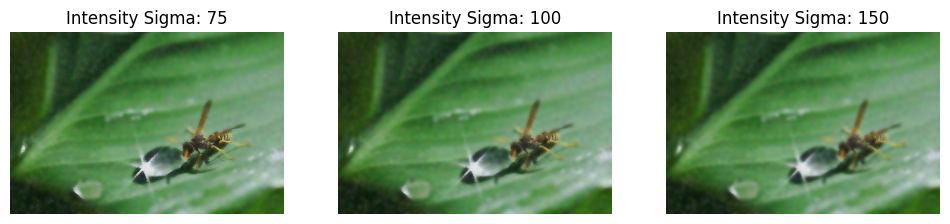

In [533]:
def varySigmaRBilater():
    """Plot results by varying sigma_s in bilateral filtering"""
    img = cv2.imread('../images/IMG2.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Separate the color channels using numpy indexing
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]
        
    sigma_r_values = [75,100,150]

    # Filter the image with different kernel sizes and plot in same plot using subplots
    plt.figure(figsize=(12, 6))

    for sigma_r in sigma_r_values:
        # Apply the Gaussian filter to each channel
        R_filtered = bilaterFilter(R,k=7,sigma_s=2,sigma_r=sigma_r)
        G_filtered = bilaterFilter(G, k=7,sigma_s=2,sigma_r=sigma_r)
        B_filtered = bilaterFilter(B, k=7,sigma_s=2,sigma_r=sigma_r)

        # Stack the filtered channels back into a color image
        img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)
        plt.subplot(1, len(kernel_sizes), sigma_r_values.index(sigma_r) + 1)
        plt.imshow(img_out)
        plt.title(f'Intensity Sigma: {sigma_r}')
        plt.axis('off')
    plt.show()
varySigmaRBilater()   
    

### Kernel Size (k):
- **Effect**: The kernel size determines the spatial extent of the filter (the area over which the filter operates).
- **Larger k**: A larger kernel includes more neighboring pixels in the filtering process. While this can lead to stronger smoothing, it may also start blurring important details, particularly if the spatial and range sigmas are not well-tuned.
- **Smaller k**: A smaller kernel restricts the filtering to a smaller local region, potentially leading to less smoothing but better edge preservation. It may also result in more noise being left in the image if not combined with appropriate sigma values.

### Spatial Standard Deviation (σs):
- **Effect**: Spatial sigma controls the amount of spatial smoothing, i.e., how far the filter considers neighboring pixels in terms of spatial distance.
- **Larger σs**: A larger spatial standard deviation allows distant pixels to have more influence in the filtering process. This leads to more spatial smoothing, which can blur textures while keeping major edges.
- **Smaller σs**: A smaller σs limits the influence to nearby pixels only. The filter acts more locally, preserving edges and fine details, but might leave more noise in the flat regions due to less smoothing.

### Range Standard Deviation (σr):
- **Effect**: σr controls how sensitive the filter is to differences in pixel intensities (range differences).
- **Larger σr**: A larger range standard deviation means the filter will tolerate larger intensity differences between neighboring pixels. This leads to more smoothing across both similar and slightly different intensity values, but may cause some edge blurring since pixels on either side of an edge will have a stronger influence.
- **Smaller σr**: A smaller σr makes the filter sensitive to even small intensity differences. It will primarily smooth similar-intensity pixels, leading to excellent edge preservation, but potentially leaving some noise in the flat regions. It prevents smoothing across sharp intensity changes, preserving edges very well.

## 2.6

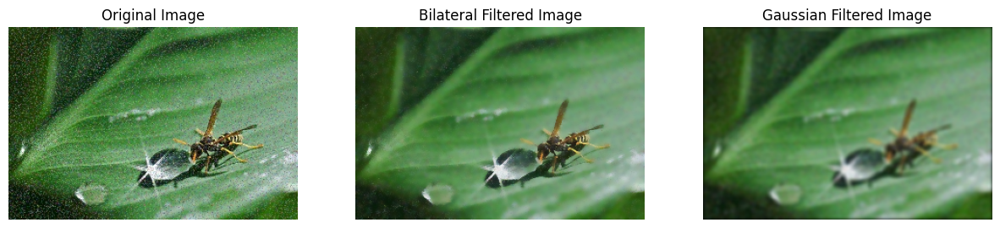

In [534]:
def compare_bilateral_gaussian():
    # Read image
    img = cv2.imread('../images/IMG2.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Separate the color channels using numpy indexing
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply the bilateral filter to each channel
    R_filtered = bilaterFilter(R, k=7, sigma_s=2, sigma_r=50)
    G_filtered = bilaterFilter(G, k=7, sigma_s=2, sigma_r=50)
    B_filtered = bilaterFilter(B, k=7, sigma_s=2, sigma_r=50)

    # Stack the filtered channels back into a color image
    img_bilateral = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

    # Apply the Gaussian filter to each channel
    R_filtered = gaussFilter(R, sigma=2, k=7)
    G_filtered = gaussFilter(G, sigma=2, k=7)
    B_filtered = gaussFilter(B, sigma=2, k=7)

    # Stack the filtered channels back into a color image
    img_gaussian = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

    # Display the original and filtered images
    plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(img_bilateral)
    plt.title('Bilateral Filtered Image')
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(img_gaussian)
    plt.title('Gaussian Filtered Image')
    plt.axis('off')

    plt.show()

compare_bilateral_gaussian()

### Difference between bilateral and gaussian
1. **Gaussian Filter**
- **Smoothing**: The Gaussian filter performs uniform smoothing across the entire image, without regard to intensity differences between neighboring pixels. It applies a convolution with a Gaussian kernel, where the weights are determined by the spatial distance from the center pixel.
- **Effect on Edges**: Since the Gaussian filter only considers spatial proximity, it smooths across edges as well as flat regions. This means that edges (sharp changes in intensity) will be blurred along with noise. The stronger the smoothing (larger sigma), the more pronounced the blurring, and fine details are lost.
- **Use Case**: The Gaussian filter is suitable for removing noise from images where preserving edges is not a priority. It is generally used when the goal is uniform smoothing, such as for pre-processing or creating a blurred version of an image.

2. **Bilateral Filter**
- **Smoothing**: The bilateral filter smooths while considering both spatial proximity and intensity differences. Pixels that are close in space but have significantly different intensities are given less weight in the filtering process. This means that while regions with similar intensities will be smoothed, regions with sharp differences (i.e., edges) will be preserved.
- **Effect on Edges**: Unlike the Gaussian filter, the bilateral filter preserves edges well. It selectively smooths areas of uniform intensity but avoids blurring across edges. This is because pixels on either side of a strong edge (with large intensity differences) do not influence each other significantly.
- **Use Case**: The bilateral filter is ideal when both noise reduction and edge preservation are important. It's often used in applications like denoising photographs or pre-processing before edge detection to maintain the integrity of the edges while removing noise from smoother regions.

These effects are clearly visible in the images plotted above.
In Gaussian, the ant is also blurred along with the background and noise while in bilateral the features of the ant are preserved.

# Edge of Glory

## 3.1

In [535]:
def sobelFilter(img):
    # Sobel kernels for horizontal and vertical edge detection
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]])
    
    sobel_y = np.array([[1, 2, 1],
                        [ 0, 0, 0],
                        [-1, -2, -1]])
    
    # Get image dimensions
    height, width = img.shape
    
    # Initialize output image
    grad_x = np.zeros((height, width))
    grad_y = np.zeros((height, width))

    grad_x = conv2D(img, sobel_x)
    grad_y = conv2D(img, sobel_y)
            
    return grad_x, grad_y

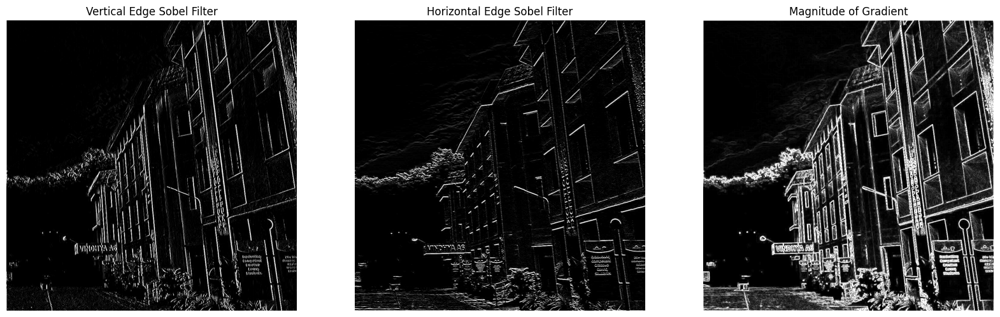

In [536]:
def applySobelFilter():
    """Read image, convert to grayscale and use Sobel Filter to detect edges"""
    # Read image
    img = cv2.imread('../images/IMG3.jpeg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Extract RGB channels
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply sobelx and sobely filters to each channel
    R_grad_x, R_grad_y = sobelFilter(R)
    G_grad_x, G_grad_y = sobelFilter(G)
    B_grad_x, B_grad_y = sobelFilter(B)

    # Compute final gradx and grady by taking average of all channels
    grad_x = (R_grad_x + G_grad_x + B_grad_x) / 3
    grad_y = (R_grad_y + G_grad_y + B_grad_y) / 3
    grad_mag = np.sqrt(grad_x**2 + grad_y**2)

    # Clip the values to the range [0, 255] and convert to uint8
    grad_x = np.clip(grad_x, 0, 255).astype(np.uint8)
    grad_y = np.clip(grad_y, 0, 255).astype(np.uint8)
    grad_mag = np.clip(grad_mag, 0, 255).astype(np.uint8)

    # Display the vertical edge detection
    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1)
    plt.imshow(grad_x, cmap='gray')
    plt.title('Vertical Edge Sobel Filter')
    plt.axis('off')

    # Display the horizontal edge detection
    plt.subplot(1,3,2)
    plt.imshow(grad_y, cmap='gray')
    plt.title('Horizontal Edge Sobel Filter')
    plt.axis('off')

    # Display the magnitude of gradient
    plt.subplot(1,3,3)
    plt.imshow(grad_mag, cmap='gray')
    plt.title('Magnitude of Gradient')
    plt.axis('off')
    plt.show()

applySobelFilter()

## 3.2

In [537]:
def prewittFilter(img):
    # Prewitt kernels for horizontal and vertical edge detection
    prewitt_x = np.array([[-1, 0, 1],
                          [-1, 0, 1],
                          [-1, 0, 1]])
    
    prewitt_y = np.array([[1, 1, 1],
                          [ 0,  0,  0],
                          [-1, -1, -1]])
    
    # Get image dimensions
    height, width = img.shape
    
    # Initialize output image
    grad_x = np.zeros((height, width))
    grad_y = np.zeros((height, width))
 
    grad_x = conv2D(img, prewitt_x)
    grad_y = conv2D(img, prewitt_y)

    return grad_x, grad_y

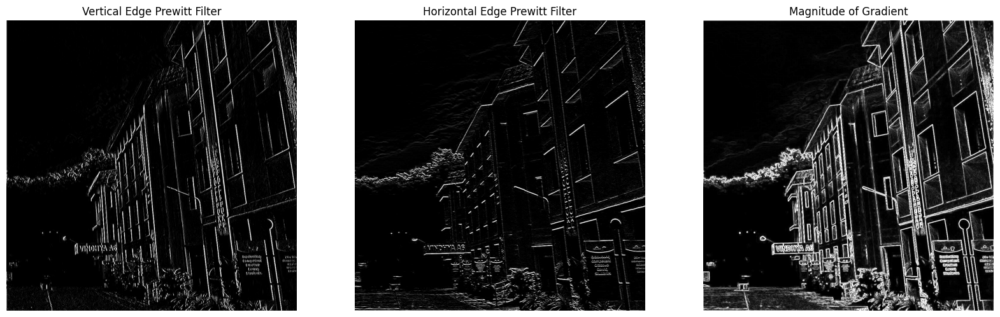

In [538]:
def applyPrewittFilter():
    """Read image, convert to grayscale and apply Prewitt filter to get horixontal and vertical edges"""
    # Read image
    img = cv2.imread('../images/IMG3.jpeg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Extract RGB channels
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply prewittx and prewitty filters to each channel
    R_grad_x, R_grad_y = prewittFilter(R)
    G_grad_x, G_grad_y = prewittFilter(G)
    B_grad_x, B_grad_y = prewittFilter(B)

    # Compute final gradx and grady by taking average of all channels
    grad_x = (R_grad_x + G_grad_x + B_grad_x) / 3
    grad_y = (R_grad_y + G_grad_y + B_grad_y) / 3
    grad_mag = np.sqrt(grad_x**2 + grad_y**2)

    # Clip the values to the range [0, 255] and convert to uint8
    grad_x = np.clip(grad_x, 0, 255).astype(np.uint8)
    grad_y = np.clip(grad_y, 0, 255).astype(np.uint8)
    grad_mag = np.clip(grad_mag, 0, 255).astype(np.uint8)

    # Display the vertical edge detection
    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1)
    plt.imshow(grad_x, cmap='gray')
    plt.title('Vertical Edge Prewitt Filter')
    plt.axis('off')

    # Display the horizontal edge detection
    plt.subplot(1,3,2)
    plt.imshow(grad_y, cmap='gray')
    plt.title('Horizontal Edge Prewitt Filter')
    plt.axis('off')

    # Display the magnitude of gradient
    plt.subplot(1,3,3)
    plt.imshow(grad_mag, cmap='gray')
    plt.title('Magnitude of Gradient')
    plt.axis('off')

    plt.show()

applyPrewittFilter()

## 3.3

In [539]:
def robertsFilter(img):    
    # Define Roberts cross kernels
    roberts_x = np.array([[1, 0],
                          [0, -1]])
    roberts_y = np.array([[0, 1],
                          [-1, 0]])
    
    # Get image dimensions
    height, width = img.shape
    
    # Initialize output edge map
    gx = np.zeros((height, width), dtype=np.float64)
    gy = np.zeros((height, width), dtype=np.float64)
    
    # Apply Roberts cross filter
    gx = conv2D(img, roberts_x)
    gy = conv2D(img, roberts_y)

    return gx, gy

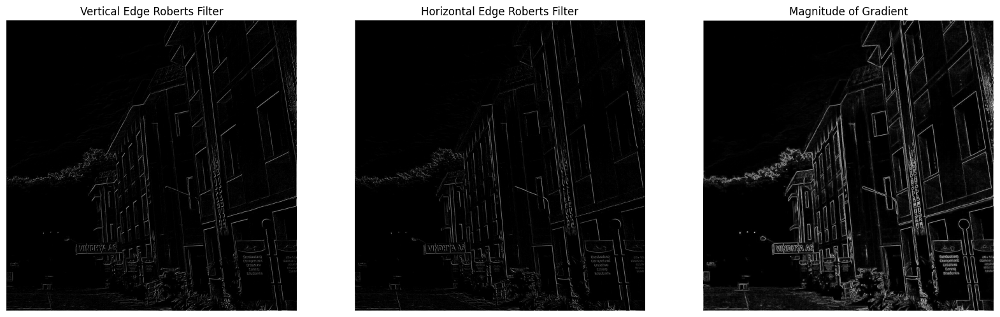

In [540]:
def applyRobertsFilter():
    """Read image, convert to grayscale and apply roberts filter to detect edges"""
    # Read image
    img = cv2.imread('../images/IMG3.jpeg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Extract RGB channels
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply roberts x and y filters to each channel
    R_grad_x, R_grad_y = robertsFilter(R)
    G_grad_x, G_grad_y = robertsFilter(G)
    B_grad_x, B_grad_y = robertsFilter(B)

    # Compute final gradx and grady by taking average of all channels
    grad_x = (R_grad_x + G_grad_x + B_grad_x) / 3
    grad_y = (R_grad_y + G_grad_y + B_grad_y) / 3
    grad_mag = np.sqrt(grad_x**2 + grad_y**2)

    # Clip the values to the range [0, 255] and convert to uint8
    grad_x = np.clip(grad_x, 0, 255).astype(np.uint8)
    grad_y = np.clip(grad_y, 0, 255).astype(np.uint8)
    grad_mag = np.clip(grad_mag, 0, 255).astype(np.uint8)

    # Display the vertical edge detection
    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1)
    plt.imshow(grad_x, cmap='gray')
    plt.title('Vertical Edge Roberts Filter')
    plt.axis('off')

    # Display the horizontal edge detection
    plt.subplot(1,3,2)
    plt.imshow(grad_y, cmap='gray')
    plt.title('Horizontal Edge Roberts Filter')
    plt.axis('off')

    # Display the magnitude of gradient
    plt.subplot(1,3,3)
    plt.imshow(grad_mag, cmap='gray')
    plt.title('Magnitude of Gradient')
    plt.axis('off')

    plt.show()

applyRobertsFilter()

## 3.5

In [541]:
def generateLaplacianKernel(size):
    laplacian_kernel = np.zeros((size, size))
    if size == 3:
        laplacian_kernel = np.array([[0, -1, 0],
                                    [-1,  4, -1],
                                    [0, -1, 0]])
    elif size == 5:
        laplacian_kernel = np.array([[ 0,  0, -1,  0,  0],
                                    [ 0, -1, -2, -1,  0],
                                    [-1, -2, 16, -2, -1],
                                    [ 0, -1, -2, -1,  0],
                                    [ 0,  0, -1,  0,  0]])
    elif size == 7:
        laplacian_kernel = np.array([[ 0,  0,  0, -1,  0,  0,  0],
                                    [ 0,  0, -1, -2, -1,  0,  0],
                                    [ 0, -1, -2, -4, -2, -1,  0],
                                    [-1, -2, -4, 44, -4, -2, -1],
                                    [ 0, -1, -2, -4, -2, -1,  0],
                                    [ 0,  0, -1, -2, -1,  0,  0],
                                    [ 0,  0,  0, -1,  0,  0,  0]])
        
    else:
        raise ValueError("Kernel size should be 3, 5 or 7.")
    return laplacian_kernel


In [542]:
def laplacianFilter(img,k):
    kernel = generateLaplacianKernel(k)

    # Get image dimensions
    height, width = img.shape
    
    # Initialize output image
    gradient_magnitude = np.zeros((height, width))
        
    # Apply convolution
    gradient_magnitude = conv2D(img, kernel)

    return gradient_magnitude


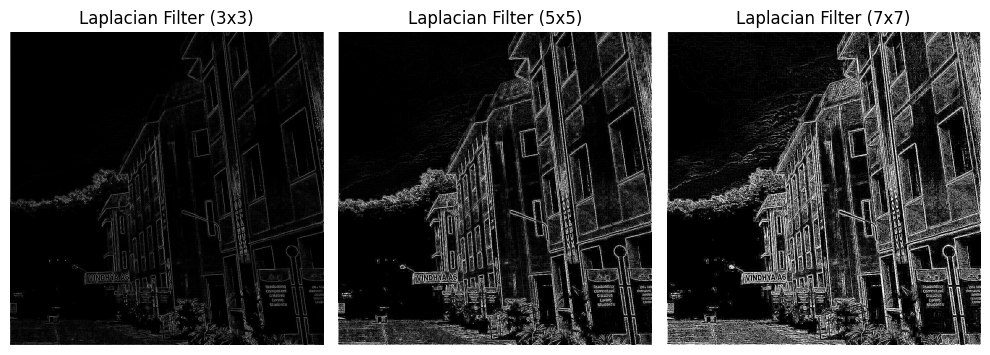

In [543]:
def applyLaplacianFilter():
    """Read image, convert to grayscale and apply Laplacian filter to detect edges"""
    # Read image
    img = cv2.imread('../images/IMG3.jpeg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Extract RGB channels
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply Laplacian filter to each channel
    R_filtered_3 = laplacianFilter(R, 3)
    G_filtered_3 = laplacianFilter(G, 3)
    B_filtered_3 = laplacianFilter(B, 3)

    # Compute final gradx and grady by taking average of all channels
    edge_map_3 = (R_filtered_3 + G_filtered_3 + B_filtered_3) / 3

    # Apply Laplacian filter to each channel
    R_filtered_5 = laplacianFilter(R, 5)
    G_filtered_5 = laplacianFilter(G, 5)
    B_filtered_5 = laplacianFilter(B, 5)

    # Compute final gradx and grady by taking average of all channels
    edge_map_5 = (R_filtered_5 + G_filtered_5 + B_filtered_5) / 3

    # Apply Laplacian filter to each channel
    R_filtered_7 = laplacianFilter(R, 7)
    G_filtered_7 = laplacianFilter(G, 7)
    B_filtered_7 = laplacianFilter(B, 7)

    # Compute final gradx and grady by taking average of all channels
    edge_map_7 = (R_filtered_7 + G_filtered_7 + B_filtered_7) / 3    

    # Clip the values to the range [0, 255] and convert to uint8
    edge_map_3 = np.clip(edge_map_3, 0, 255).astype(np.uint8)
    edge_map_5 = np.clip(edge_map_5, 0, 255).astype(np.uint8)
    edge_map_7 = np.clip(edge_map_7, 0, 255).astype(np.uint8)
    
    # Display the results
    plt.figure(figsize=(10, 6))
    
    plt.subplot(1, 3, 1)
    plt.imshow(edge_map_3, cmap='gray')
    plt.title('Laplacian Filter (3x3)')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(edge_map_5, cmap='gray')
    plt.title('Laplacian Filter (5x5)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(edge_map_7, cmap='gray')
    plt.title('Laplacian Filter (7x7)')
    plt.axis('off')

    plt.tight_layout()   
    plt.show()

applyLaplacianFilter()

### Effect of kernel size
- With a smaller kernel, the filter emphasizes fine, sharp edges. The output primarily highlights high-frequency components of the image, making the edges more prominent and giving less consideration to surrounding areas.
- A 3x3 kernel tends to be more sensitive to noise since it only considers a small neighborhood around each pixel. Therefore, along with edges, small noise elements in the image might also be detected as edges.
- As kernel size increases, broader edges and finer details can be detected. 
- It also becomes less sensitive to noise around specific regions in the image.


## 3.6

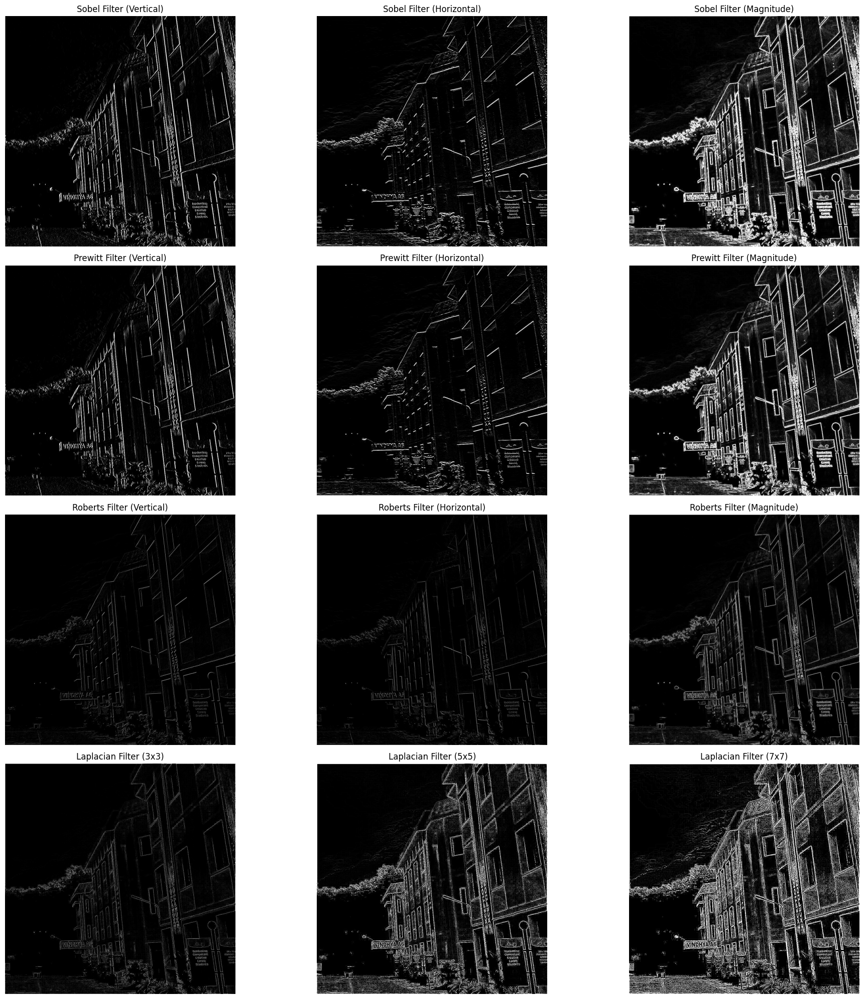

In [544]:
def compare_across_filters():
    # Read image
    img = cv2.imread('../images/IMG3.jpeg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Extract RGB channels
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    plt.figure(figsize=(20, 20))
    
    # Apply Sobel filter to each channel
    R_grad_x, R_grad_y = sobelFilter(R)
    G_grad_x, G_grad_y = sobelFilter(G)
    B_grad_x, B_grad_y = sobelFilter(B)

    # Compute final gradx and grady by taking average of all channels
    grad_x_sobel = (R_grad_x + G_grad_x + B_grad_x) / 3
    grad_y_sobel = (R_grad_y + G_grad_y + B_grad_y) / 3
    grad_mag_sobel = np.sqrt(grad_x_sobel**2 + grad_y_sobel**2)

    # Clip the values to the range [0, 255] and convert to uint8
    grad_x_sobel = np.clip(grad_x_sobel, 0, 255).astype(np.uint8)
    grad_y_sobel = np.clip(grad_y_sobel, 0, 255).astype(np.uint8)
    grad_mag_sobel = np.clip(grad_mag_sobel, 0, 255).astype(np.uint8)

    # Plot
    plt.subplot(4, 3, 1)
    plt.imshow(grad_x_sobel, cmap='gray')
    plt.title('Sobel Filter (Vertical)')
    plt.axis('off')

    plt.subplot(4, 3, 2)
    plt.imshow(grad_y_sobel, cmap='gray')
    plt.title('Sobel Filter (Horizontal)')
    plt.axis('off')

    plt.subplot(4, 3, 3)
    plt.imshow(grad_mag_sobel, cmap='gray')
    plt.title('Sobel Filter (Magnitude)')
    plt.axis('off')


    # Apply Prewitt filter to each channel
    R_grad_x, R_grad_y = prewittFilter(R)
    G_grad_x, G_grad_y = prewittFilter(G)
    B_grad_x, B_grad_y = prewittFilter(B)

    # Compute final gradx and grady by taking average of all channels
    grad_x_prewitt = (R_grad_x + G_grad_x + B_grad_x) / 3
    grad_y_prewitt = (R_grad_y + G_grad_y + B_grad_y) / 3
    grad_mag_prewitt = np.sqrt(grad_x_prewitt**2 + grad_y_prewitt**2)

    # Clip the values to the range [0, 255] and convert to uint8
    grad_x_prewitt = np.clip(grad_x_prewitt, 0, 255).astype(np.uint8)
    grad_y_prewitt = np.clip(grad_y_prewitt, 0, 255).astype(np.uint8)
    grad_mag_prewitt = np.clip(grad_mag_prewitt, 0, 255).astype(np.uint8)

    # Plot
    plt.subplot(4, 3, 4)
    plt.imshow(grad_x_prewitt, cmap='gray')
    plt.title('Prewitt Filter (Vertical)')
    plt.axis('off')

    plt.subplot(4, 3, 5)
    plt.imshow(grad_y_prewitt, cmap='gray')
    plt.title('Prewitt Filter (Horizontal)')
    plt.axis('off')

    plt.subplot(4, 3, 6)
    plt.imshow(grad_mag_prewitt, cmap='gray')
    plt.title('Prewitt Filter (Magnitude)')
    plt.axis('off')

    # Apply Roberts filter to each channel
    R_grad_x, R_grad_y = robertsFilter(R)
    G_grad_x, G_grad_y = robertsFilter(G)
    B_grad_x, B_grad_y = robertsFilter(B)

    # Compute final gradx and grady by taking average of all channels
    grad_x_roberts = (R_grad_x + G_grad_x + B_grad_x) / 3
    grad_y_roberts = (R_grad_y + G_grad_y + B_grad_y) / 3
    grad_mag_roberts = np.sqrt(grad_x_roberts**2 + grad_y_roberts**2)

    # Clip the values to the range [0, 255] and convert to uint8
    grad_x_roberts = np.clip(grad_x_roberts, 0, 255).astype(np.uint8)
    grad_y_roberts = np.clip(grad_y_roberts, 0, 255).astype(np.uint8)
    grad_mag_roberts = np.clip(grad_mag_roberts, 0, 255).astype(np.uint8)

    # Plot
    plt.subplot(4, 3, 7)
    plt.imshow(grad_x_roberts, cmap='gray')
    plt.title('Roberts Filter (Vertical)')
    plt.axis('off')

    plt.subplot(4, 3, 8)
    plt.imshow(grad_y_roberts, cmap='gray')
    plt.title('Roberts Filter (Horizontal)')
    plt.axis('off')

    plt.subplot(4, 3, 9)
    plt.imshow(grad_mag_roberts, cmap='gray')
    plt.title('Roberts Filter (Magnitude)')
    plt.axis('off')

    # Apply Laplacian filter of size 3 to each channel
    R_filtered_3 = laplacianFilter(R, 3)
    G_filtered_3 = laplacianFilter(G, 3)
    B_filtered_3 = laplacianFilter(B, 3)

    # Compute final gradx and grady by taking average of all channels
    edge_map_3 = (R_filtered_3 + G_filtered_3 + B_filtered_3) / 3

    # Clip the values to the range [0, 255] and convert to uint8
    edge_map_3 = np.clip(edge_map_3, 0, 255).astype(np.uint8)

    # Apply Laplacian filter of size 5 to each channel
    R_filtered_5 = laplacianFilter(R, 5)
    G_filtered_5 = laplacianFilter(G, 5)
    B_filtered_5 = laplacianFilter(B, 5)

    # Compute final gradx and grady by taking average of all channels
    edge_map_5 = (R_filtered_5 + G_filtered_5 + B_filtered_5) / 3

    # Clip the values to the range [0, 255] and convert to uint8
    edge_map_5 = np.clip(edge_map_5, 0, 255).astype(np.uint8)

    # Apply Laplacian filter of size 7 to each channel
    R_filtered_7 = laplacianFilter(R, 7)
    G_filtered_7 = laplacianFilter(G, 7)
    B_filtered_7 = laplacianFilter(B, 7)

    # Compute final gradx and grady by taking average of all channels
    edge_map_7 = (R_filtered_7 + G_filtered_7 + B_filtered_7) / 3

    # Clip the values to the range [0, 255] and convert to uint8
    edge_map_7 = np.clip(edge_map_7, 0, 255).astype(np.uint8)

    # Plot
    plt.subplot(4, 3, 10)
    plt.imshow(edge_map_3, cmap='gray')
    plt.title('Laplacian Filter (3x3)')
    plt.axis('off')

    plt.subplot(4, 3, 11)
    plt.imshow(edge_map_5, cmap='gray')
    plt.title('Laplacian Filter (5x5)')
    plt.axis('off')

    plt.subplot(4, 3, 12)
    plt.imshow(edge_map_7, cmap='gray')
    plt.title('Laplacian Filter (7x7)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()
    
compare_across_filters()   

- Prewitt and Sobel filters are similar in their ability to detect horizontal and vertical edges, but Sobel performs better in noisy environments due to its built-in smoothing.
- Laplacian excels at detecting fine details in all directions but is sensitive to noise, making it more suited for clean images or situations where detailed edge detection is required.
- Roberts is best for diagonal edge detection and fine structures but performs poorly in the presence of noise and when detecting horizontal or vertical edges.

# Sharpen Up

## 4.1

In [545]:
def unsharpMask(img, k, sigma):
    """Apply unsharp mask filter to the input image."""
    # Apply Gaussian filter to the image
    img_blur = gaussFilter(img, sigma, k)

    # Extract details in image
    img_detail = img - img_blur

    # Add back to original image
    img_out = img + img_detail

    return img_out
    

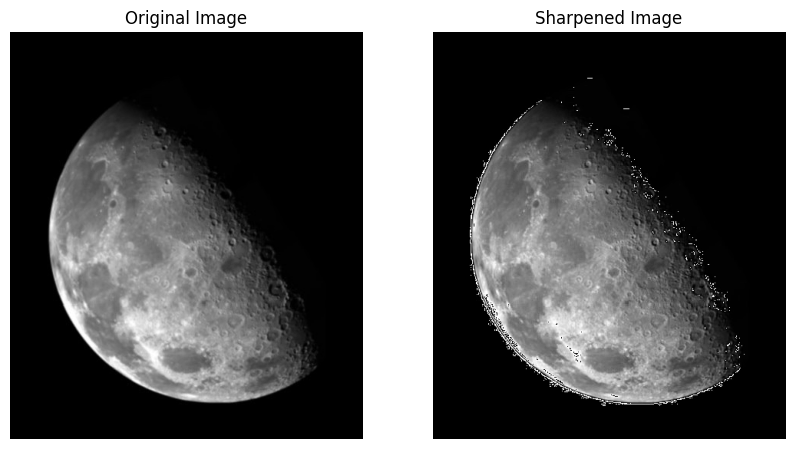

In [546]:
def applyUnsharpMasking():
    # Read image
    img = cv2.imread('../images/IMG4.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply unsharp mask filter
    sharpened_img = unsharpMask(img, k=3, sigma=1.5)

    # Clip the values to lie between 0 to 255
    sharpened_img = np.clip(sharpened_img, 0, 255).astype(np.uint8)

    # Plot original image and sharpened image
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(sharpened_img, cmap='gray')
    plt.title('Sharpened Image')
    plt.axis('off')
    plt.show()

applyUnsharpMasking()

## 4.2

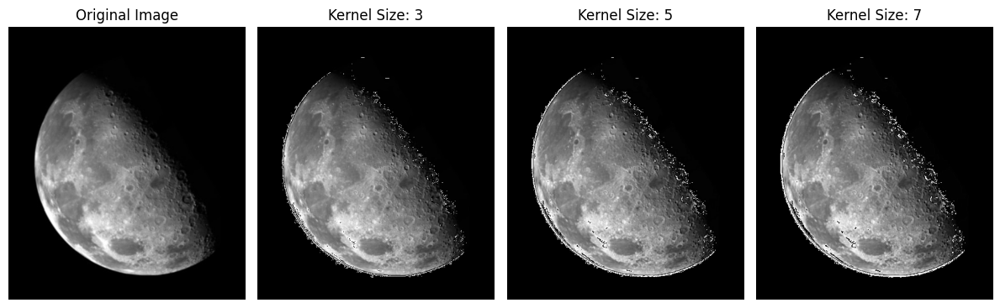

In [547]:
def varyKernelSize():
    """Apply unsharp mask filter with different kernel sizes."""
    # Read image
    img = cv2.imread('../images/IMG4.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Prepare to plot
    plt.figure(figsize=(12, 6))

    # Plot original image
    plt.subplot(1, 4, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Apply unsharp mask filter with different kernel sizes
    for i, k in enumerate([3, 5, 7]):
        sharpened_img = unsharpMask(img, k=k, sigma=1.5)

        plt.subplot(1, 4, i + 2)
        plt.imshow(sharpened_img, cmap='gray')
        plt.title(f'Kernel Size: {k}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

varyKernelSize()

### Effect of Kernel Size (k)
The kernel size, k, defines the area over which the Gaussian blur is applied before subtracting it from the original image. In the context of unsharp masking, changing the kernel size impacts how much blurring (and thus edge enhancement) is applied.
- Small kernel causes minimal blurring, thus enhancement of edges is less compared to the case with larger kernels.
- Larger kernels causes more blurring, thus the edges become more prominent when unsharp masking is performed. This also introduces more artifacts and is less affected by noise.

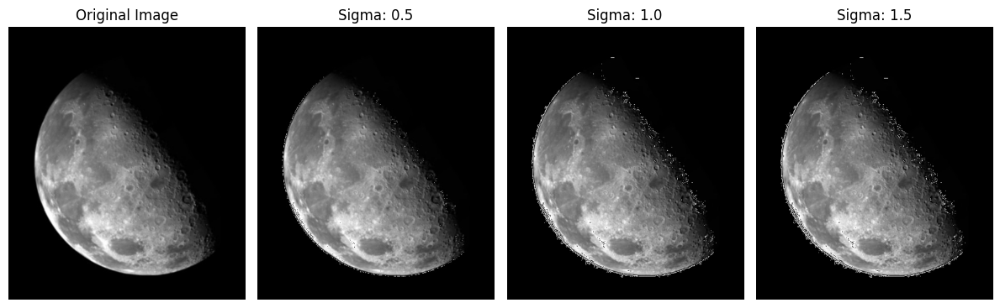

In [548]:
def varySigma():
    """Apply unsharp mask filter with different sigma values."""
    # Read image
    img = cv2.imread('../images/IMG4.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Prepare to plot
    plt.figure(figsize=(12, 6))

    # Plot original image
    plt.subplot(1, 4, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Apply unsharp mask filter with different sigma values
    for i, sigma in enumerate([0.5, 1.0, 1.5]):
        sharpened_img = unsharpMask(img, k=3, sigma=sigma)

        plt.subplot(1, 4, i + 2)
        plt.imshow(sharpened_img, cmap='gray')
        plt.title(f'Sigma: {sigma}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()
    
varySigma()

### Effect of sigma
The standard deviation, σ, controls the spread of the Gaussian blur applied to the image. It affects how much neighboring pixels influence the blurred result. Larger sigma values result in more blurred images, thus changing the amount of detail retained or suppressed in the sharpening process.
- A small sigma value means a tight Gaussian distribution, causing very little blurring. Thus not many features and atrifacts are captured.
- A large sigma value results in heavy blurring of the image. When subtracted from the original, the sharpening effect focuses mainly on the largest, most prominent edges, leaving smaller details relatively untouched.

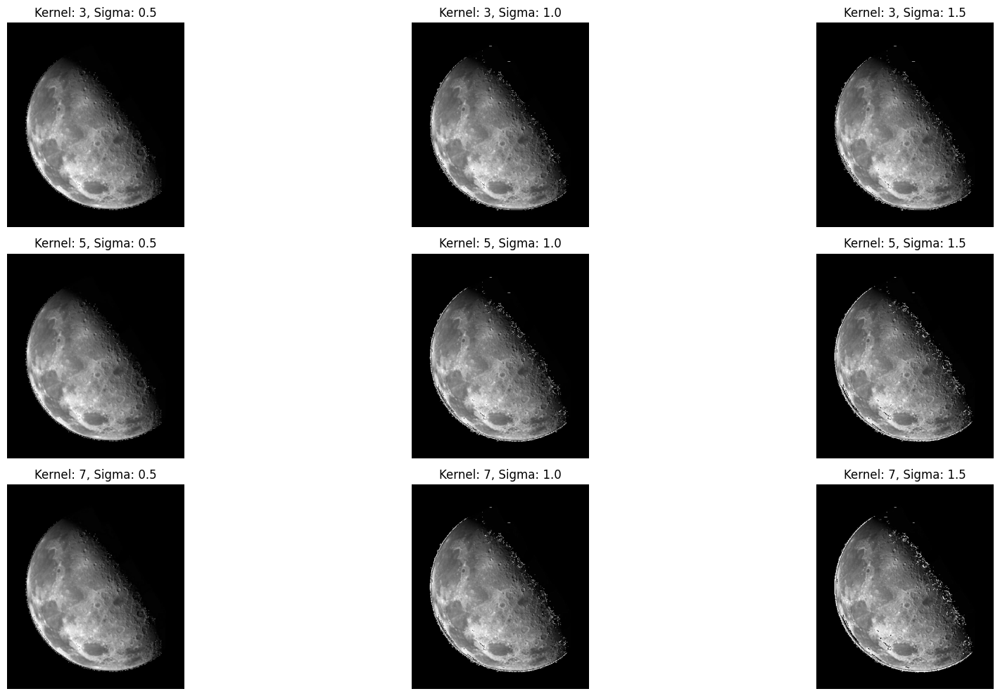

In [549]:
def varyKernelSizeSigma():
    """Apply unsharp mask filter with different kernel sizes and sigma values."""
    # Read image
    img = cv2.imread('../images/IMG4.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Prepare to plot
    plt.figure(figsize=(20, 10))

    # Plot 9 images with all combinations possible
    for i, k in enumerate([3, 5, 7]):
        for j, sigma in enumerate([0.5, 1.0, 1.5]):
            sharpened_img = unsharpMask(img, k=k, sigma=sigma)

            plt.subplot(3, 3, 3*i + j + 1)
            plt.imshow(sharpened_img, cmap='gray')
            plt.title(f'Kernel: {k}, Sigma: {sigma}')
            plt.axis('off')
    plt.tight_layout()
    plt.show()

varyKernelSizeSigma()

### Effect of kernel size
- Smaller k would detect fine details and edges but locally within small regions of the image.
- Larger k would detect edges over a larger area, potentially highlighting broader features.
- Smaller k could be vulnerable to enhancing noise as well.

### Effect of sigma
- Sigma controls the sharpening effect.
- Small sigma introduces subtle sharpening effect. It is less likely to introduce artifacts. It may not significantly enhance edges in low-contrast areas.
- Large sigma has a strong sharpening effect. It can significantly introduce atrifacts or over sharpen the image.

## 4.3

In [550]:
def highboostFilter(img, k, sigma, A):
    """Apply high boost filtering to an image"""
    blurred_image = gaussFilter(img, sigma, k)
    details = img - blurred_image
    sharpened_img = img + A * details
        
    return sharpened_img    

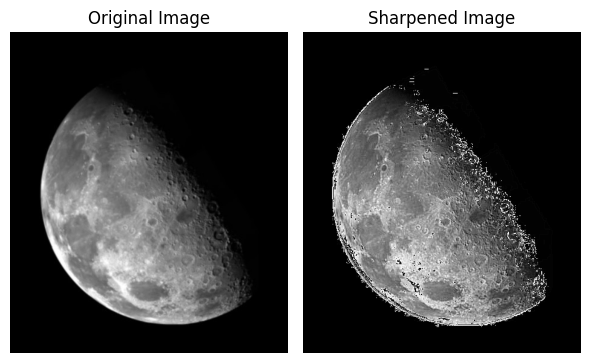

In [551]:
def applyHBF():
    # Read image
    img = cv2.imread('../images/IMG4.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    sharpened_image = highboostFilter(img, k=3, sigma=1.5, A=5)
    sharpened_image = np.clip(sharpened_image, 0, 255).astype(np.uint8)

    # Plot original image and sharpened image
    plt.figure(figsize=(6, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(sharpened_image, cmap='gray')
    plt.title('Sharpened Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

applyHBF()

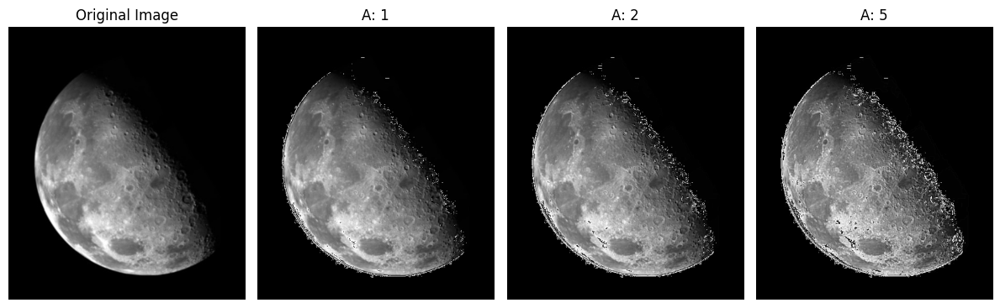

In [552]:
def compareAcrossA():
    """Analyse effect of boost factor A in HBF"""
    # Read image
    img = cv2.imread('../images/IMG4.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Prepare to plot
    plt.figure(figsize=(12, 6))

    # Plot original image
    plt.subplot(1, 4, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Apply high boost filter with different A values
    for i, A in enumerate([1, 2, 5]):
        sharpened_img = highboostFilter(img, k=3, sigma=1.5, A=A)

        plt.subplot(1, 4, i + 2)
        plt.imshow(sharpened_img, cmap='gray')
        plt.title(f'A: {A}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()
compareAcrossA()

### Role of A
- Low A values (e.g., 1): Provide a subtle sharpening effect.
- Moderate A values (e.g., 2.0): Sharpen edges more aggressively while maintaining a balance between details and noise.
- High A values (e.g., 3 or higher): Enhance edges significantly, but can also increase noise and exaggerate artifacts.

## 4.4

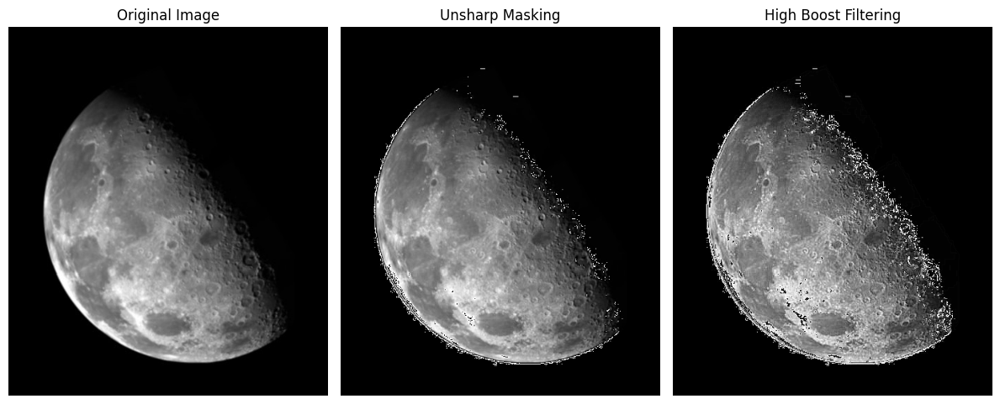

In [553]:
def compareAcrossMethods():
    """Compare the results of Unsharp Masking and High Boost Filtering"""
    # Read image
    img = cv2.imread('../images/IMG4.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Prepare to plot
    plt.figure(figsize=(12, 6))

    # Plot original image
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Apply unsharp mask filter
    sharpened_img = unsharpMask(img, k=3, sigma=1.5)
    plt.subplot(1, 3, 2)
    plt.imshow(sharpened_img, cmap='gray')
    plt.title('Unsharp Masking')
    plt.axis('off')

    # Apply high boost filter
    sharpened_img = highboostFilter(img, k=3, sigma=1.5, A=5)
    plt.subplot(1, 3, 3)
    plt.imshow(sharpened_img, cmap='gray')
    plt.title('High Boost Filtering')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

compareAcrossMethods()

### Analysis of Sharpening Methods
**Unsharp Masking**
- This method subtly enhances the edges and fine details but retains a natural appearance, making it suitable for images where moderate sharpening is desired.
- Unsharp Masking is generally better for subtle sharpening without introducing too much noise or artifacts.


**Highboost Filtering** 
- This method provides stronger edge enhancement due to the boost factor A. 
- It can enhance finer details more effectively but may also exaggerate noise if A is too large.

Thus, high boost filtering is a better option for enhancing fine details.

# Rain Rain Go Away

## 5.1

In [554]:
def meanFilterOnRain(img):
    # Extract RGB channels
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply mean filter to each channel
    R_filtered = meanFilter(R, k=5)
    G_filtered = meanFilter(G, k=5)
    B_filtered = meanFilter(B, k=5)

    # Stack the filtered channels back into a color image
    mean_img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

    # Clip the values to the range [0, 255] and convert to uint8
    mean_img_out = np.clip(mean_img_out, 0, 255).astype(np.uint8)

    return mean_img_out

In [555]:
def medianFilterOnRain(img):
    # Extract RGB channels
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply median filter to each channel
    R_filtered = medianFilter(R, k=5)
    G_filtered = medianFilter(G, k=5)
    B_filtered = medianFilter(B, k=5)

    # Stack the filtered channels back into a color image
    median_img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

    # Clip the values to the range [0, 255] and convert to uint8
    median_img_out = np.clip(median_img_out, 0, 255).astype(np.uint8)

    return median_img_out

In [556]:
def gaussianFilterOnRain(img):
    # Extract RGB channels
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply Gaussian filter to each channel
    R_filtered = gaussFilter(R, sigma=2, k=11)
    G_filtered = gaussFilter(G, sigma=2, k=11)
    B_filtered = gaussFilter(B, sigma=2, k=11)

    # Stack the filtered channels back into a color image
    gaussian_img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

    # Clip the values to the range [0, 255] and convert to uint8
    gaussian_img_out = np.clip(gaussian_img_out, 0, 255).astype(np.uint8)

    return gaussian_img_out

In [557]:
def bilateralFilterOnRain(img):
    # Extract RGB channels
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    # Apply bilateral filter to each channel
    R_filtered = bilaterFilter(R, k=7, sigma_s=2, sigma_r=50)
    G_filtered = bilaterFilter(G, k=7, sigma_s=2, sigma_r=50)
    B_filtered = bilaterFilter(B, k=7, sigma_s=2, sigma_r=50)

    # Stack the filtered channels back into a color image
    bilateral_img_out = np.stack([R_filtered, G_filtered, B_filtered], axis=2)

    # Clip the values to the range [0, 255] and convert to uint8
    bilateral_img_out = np.clip(bilateral_img_out, 0, 255).astype(np.uint8)

    return bilateral_img_out

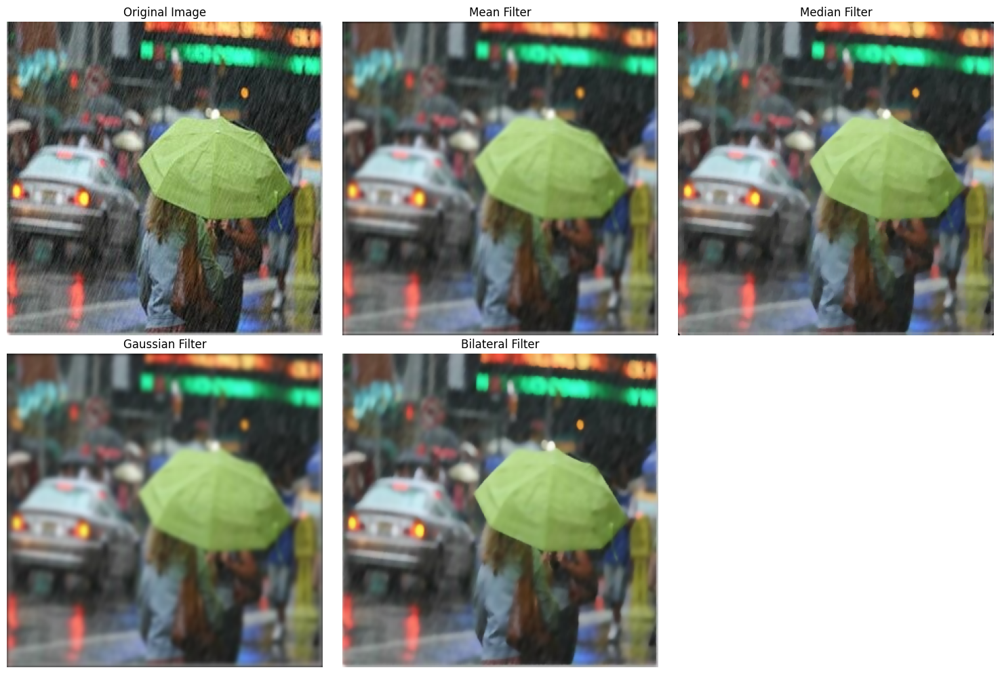

In [558]:
def plotResults():
    """Plot results from all filtering methods to compare"""
    # Read image
    img = cv2.imread('../images/IMG5.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Apply all filters to the image
    mean_img_out = meanFilterOnRain(img)
    median_img_out = medianFilterOnRain(img)
    gaussian_img_out = gaussianFilterOnRain(img)
    bilateral_img_out = bilateralFilterOnRain(img)

    # Prepare to plot
    plt.figure(figsize=(15, 10))

    # Plot original image
    plt.subplot(2, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    # Plot mean filtered image
    plt.subplot(2, 3, 2)
    plt.imshow(mean_img_out)
    plt.title('Mean Filter')
    plt.axis('off')

    # Plot median filtered image
    plt.subplot(2, 3, 3)
    plt.imshow(median_img_out)
    plt.title('Median Filter')
    plt.axis('off')

    # Plot gaussian filtered image
    plt.subplot(2, 3, 4)
    plt.imshow(gaussian_img_out)
    plt.title('Gaussian Filter')
    plt.axis('off')

    # Plot bilateral filtered image
    plt.subplot(2, 3, 5)
    plt.imshow(bilateral_img_out)
    plt.title('Bilateral Filter')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

plotResults()

### Mean Filter
- The best parameters for mean filter is k = 5. It removes the effect of rain significantly, smoothens the image and not much information about edges and objects is lost.

### Median Filter
- For median filter, the best k is 5. As can be seen above, it removes rain to a reasonable extent.

### Gaussian Filter
- For gaussian filter, the best parameters are k = 11 and sigma = 2. The large kernel size and sigma value is needed for removing the rain and smoothening the image given the image dynamics.

### Bilateral Filter
- The best parameters are k=7, sigma_s = 2 and sigma_r = 50. The rain is removed while maintaining other objects in the image.

### Final Observations
- From above plots, we see that for mean and median filter we need larger kernels to remove the rainy effect from the image but larger kernels leads to more blurring. Hence we lose some details from the image.
- For Gaussian filter, we know it is in general a low pass filter. We need to keep a large kernel and sigma to minimize the effect of rain. The rain is removed in a better way compared to mean and median but we lose information of objects in the background.
- Bilateral filtering works the best, since it replicates gaussian for rain removal and simultaneously maintains edges due to intensity transformation considerations through range kernel.

## 5.2

### What type of noise is present in the image?
- We can see Salt and Pepper noise present in the image given.

### What is the best filtering method to remove it?
- Using a **median** filter might help mitigate this noise.

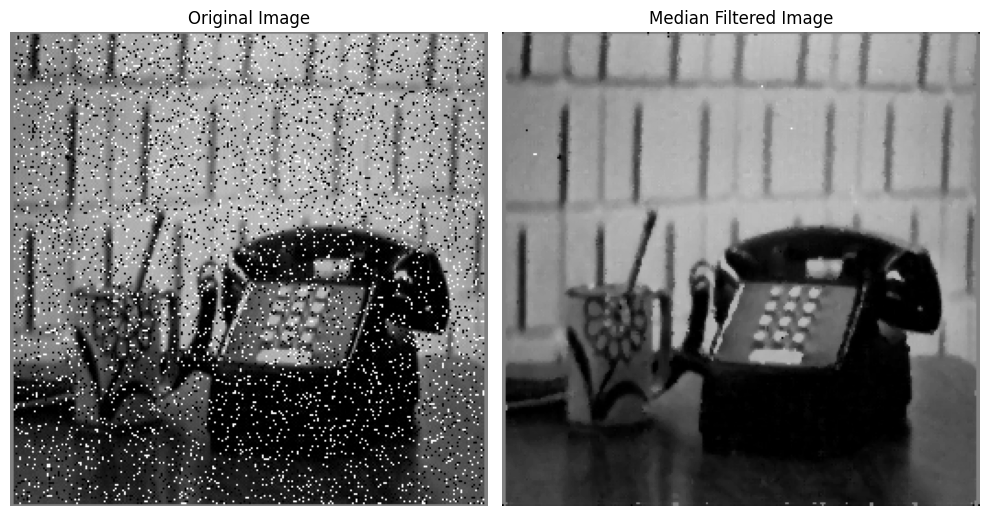

In [559]:
def applyMedianFilter():
    # Read image
    img = cv2.imread('../images/IMG6.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply median filter
    filtered_img = medianFilter(img, k=3)

    # Plot original image and filtered image
    plt.figure(figsize=(10, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(filtered_img, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

applyMedianFilter()

# Transform and Conquer

## Counting Coins

In [560]:
def circularStructuringElement(radius):
    diameter = 2 * radius + 1
    y, x = np.ogrid[-radius:radius+1, -radius:radius+1]
    mask = x**2 + y**2 <= radius*2
    kernel = np.zeros((diameter, diameter), dtype=np.uint8)
    kernel[mask] = 1
    return kernel

In [561]:
def erodeImage(img,kernel):
    """Apply erosion to given image using a square kernel of size k x k."""
    # Get image dimensions
    height, width = img.shape
    kernel_h,kernel_w = kernel.shape

    pad_height = kernel_h // 2
    pad_width = kernel_w // 2

    padded_img = np.pad(img, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant', constant_values=0)
   
    # Initialize output image
    eroded_img = np.zeros_like(img)
  
    for i in range(height):
        for j in range(width):
            # Get the neighborhood of the current pixel
            neighborhood = padded_img[i:i+kernel_h, j:j+kernel_w]
            # Apply erosion
            eroded_img[i, j] = np.min(neighborhood[kernel == 1])

    return eroded_img

In [562]:
def dilateImage(img,kernel):
    """Apply erosion to given image using a square kernel of size k x k."""
    # Get image dimensions
    height, width = img.shape
    kernel_h,kernel_w = kernel.shape

    pad_height = kernel_h // 2
    pad_width = kernel_w // 2

    padded_img = np.pad(img, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant', constant_values=0)
   
    # Initialize output image
    dilated_img = np.zeros_like(img)
  
    for i in range(height):
        for j in range(width):
            # Get the neighborhood of the current pixel
            neighborhood = padded_img[i:i+kernel_h, j:j+kernel_w]
            # Apply erosion
            dilated_img[i, j] = np.max(neighborhood[kernel == 1])

    return dilated_img

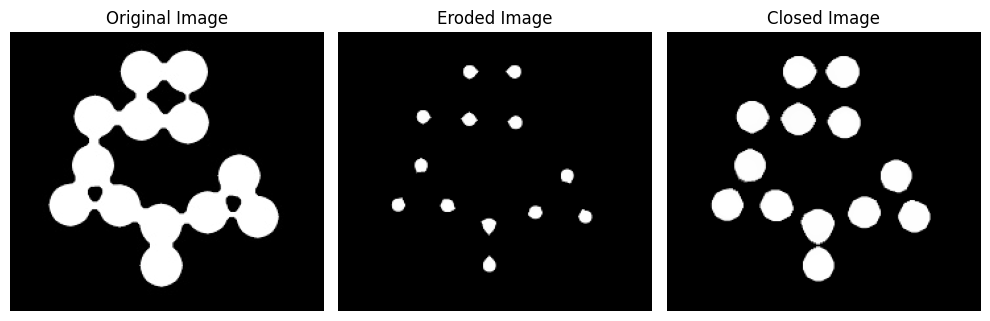

In [563]:
def erosionDilation():
    """Apply erosion and then dilation on image to perform closing in total"""
    # Read image
    img = cv2.imread('../images/IMG7.jpg', cv2.IMREAD_GRAYSCALE)

    # Generate circular kernel
    erosion_kernel = circularStructuringElement(radius=61)
    dilation_kernel = circularStructuringElement(radius=25)

    # Apply erosion followed by dilation
    eroded_img = erodeImage(img, erosion_kernel)
    closed_img = dilateImage(eroded_img, dilation_kernel)

    # Plot original image and closed image
    plt.figure(figsize=(10, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(eroded_img, cmap='gray')
    plt.title('Eroded Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(closed_img, cmap='gray')
    plt.title('Closed Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

erosionDilation()

### Steps taken:
1. Generate a circular structural element since the main objects are circular and thus a circular structural element will perform better for separation.
2. We first need to eliminate the bridges joining the coins. For this we can perform erosion. Through erosion we reduce the coins to basically circles with few pixels diameter mitigating all connections.
3. Then we need to dilate the point circles we got from eroding the original image. However, we dilate only to the extent till which the coins do not overlap again.
4. Thus overall we performed **opening** of the original image.

For erosion, we consider pixels whose neighbourhood completely matches the kernel i.e the kernel fits completely in the neighbourhood. Thus this eliminates the bridges which are less in diameter in comparison to the coins. The radius of structuring element required to do this is 61 pixels.

For dilation, we consider pixels which partially fit the structuring element. This way the boundary gets extended. For this image, the dilation radius used was 25.

## Signature Verification

In [564]:
from skimage.morphology import skeletonize
from skimage.util import invert
from skimage.filters import threshold_otsu

In [565]:
def preprocess_image(img):
    """Convert an image to binary using Otsu's thresholding."""    
    # Apply Otsu's thresholding to binarize the image
    thresh = threshold_otsu(img)
    binary_img = img > thresh
    
    return binary_img

In [566]:
def find_skeleton_of_signature(img):
    # Preprocess the image
    binary_image = preprocess_image(img)

    # Invert the binary image
    image = invert(binary_image)

    skeleton = skeletonize(image)
    # display results
    
    return skeleton

In [584]:
original_signature_1 = cv2.imread('../images/original_2_1.png', cv2.IMREAD_GRAYSCALE)
original_signature_2 = cv2.imread('../images/original_2_2.png', cv2.IMREAD_GRAYSCALE)
fake_signature_1 = cv2.imread('../images/forgeries_2_1.png', cv2.IMREAD_GRAYSCALE)
fake_signature_2 = cv2.imread('../images/forgeries_2_2.png', cv2.IMREAD_GRAYSCALE)

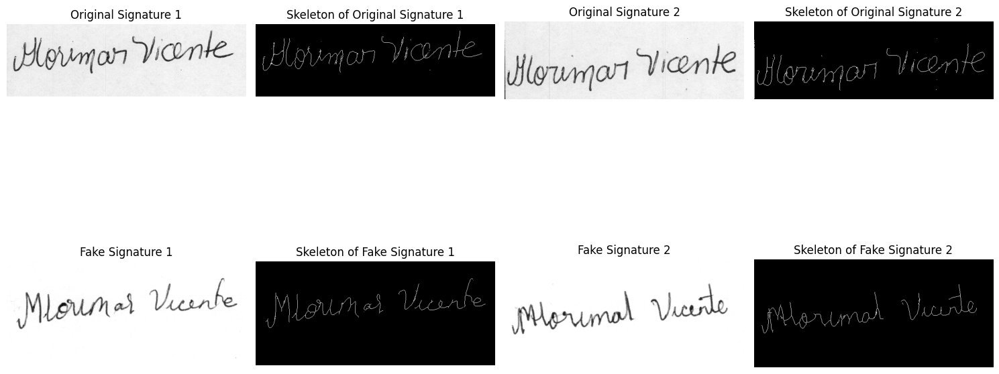

In [586]:

# Find skeletons of all signatures
original_skeleton_1 = find_skeleton_of_signature(original_signature_1)
original_skeleton_2 = find_skeleton_of_signature(original_signature_2)
fake_skeleton_1 = find_skeleton_of_signature(fake_signature_1)
fake_skeleton_2 = find_skeleton_of_signature(fake_signature_2)

# Plot original and fake signatures
plt.figure(figsize=(15, 10))

plt.subplot(2, 4, 1)
plt.imshow(original_signature_1, cmap='gray')
plt.title('Original Signature 1')
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(original_skeleton_1, cmap='gray')
plt.title('Skeleton of Original Signature 1')
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(original_signature_2, cmap='gray')
plt.title('Original Signature 2')
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(original_skeleton_2, cmap='gray')
plt.title('Skeleton of Original Signature 2')
plt.axis('off')

plt.subplot(2, 4, 5)
plt.imshow(fake_signature_1, cmap='gray')
plt.title('Fake Signature 1')
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(fake_skeleton_1, cmap='gray')
plt.title('Skeleton of Fake Signature 1')
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(fake_signature_2, cmap='gray')
plt.title('Fake Signature 2')
plt.axis('off')

plt.subplot(2, 4, 8)
plt.imshow(fake_skeleton_2, cmap='gray')
plt.title('Skeleton of Fake Signature 2')
plt.axis('off')

plt.tight_layout()
plt.show()

In [629]:
# Find similarity between original skeletons using and or operations
def iou(binary_image1, binary_image2):
    binary_image1_uint8 = (binary_image1.astype(np.uint8)) * 255
    binary_image2_uint8 = (binary_image2.astype(np.uint8)) * 255

    binary_image1_resized = cv2.resize(binary_image1_uint8, (binary_image2_uint8.shape[1], binary_image2_uint8.shape[0]), interpolation=cv2.INTER_NEAREST)

    binary_image1_resized = binary_image1_resized > 0
    binary_image2 = binary_image2 > 0

    intersection = np.logical_and(binary_image1_resized, binary_image2).sum()
    union = np.logical_or(binary_image1_resized, binary_image2).sum()
    return intersection / union if union != 0 else 0


- Skeletonization reduces binary objects to 1 pixel wide representations. This can be useful for feature extraction, and/or representing an object’s topology.
- skeletonize works by making successive passes of the image. On each pass, border pixels are identified and removed on the condition that they do not break the connectivity of the corresponding object.

Following steps have been taken in the above question:
- Preprocess the image to reduce it to a binary image using thresholding.
- Invert the image, to be able to view the skeleton better on a black background.
- Use inbuilt **skelontize** function to extract the skeleton of the image.

Fraud Detection
- From the above plot, we can see that for the fraud signatures, the skeleton varies however for the true signatures, the skeleton remains the same across all copies.
- Thus the skeleton of the signature can help us identify if a signature is fraud or legitimate.

# Body Scan Enhancement

## 7.1

In [568]:
def homomorphicFilter(img, sigma=30, gamma_low=0.5, gamma_high=1.5):
    rows, cols = img.shape
    
    # Convert the image to float32
    img = img.astype(np.float32)
    
    # Convert the image to the log domain
    img_log = np.log1p(img)  # log(1 + img) to avoid issues with log(0)
    
    # Perform FFT (Fast Fourier Transform) to get the frequency domain
    img_fft = np.fft.fft2(img_log)
    img_fft_shift = np.fft.fftshift(img_fft)  # Shift the zero frequency component to the center    
    
    # Generate Gaussian filter (high-pass)
    x = np.linspace(-1, 1, cols)
    y = np.linspace(-1, 1, rows)
    X, Y = np.meshgrid(x, y)
    D = np.sqrt(X**2 + Y**2)
    H = 1 - np.exp(-(D**2 / (2 * (sigma**2))))
    
    # Adjust for gamma values
    H = (gamma_high - gamma_low) * H + gamma_low
    
    # Apply the high-pass filter in the frequency domain
    img_filtered_fft = img_fft_shift * H
    
    # Inverse FFT to get back to the spatial domain
    img_filtered_fft_shift = np.fft.ifftshift(img_filtered_fft)
    img_filtered = np.fft.ifft2(img_filtered_fft_shift)
    
    # Convert back from the log domain
    img_filtered = np.exp(np.real(img_filtered)) - 1
    
    # Normalize the image to the range [0, 255]
    img_out = np.clip(img_filtered, 0, 255)
    img_out = img_out.astype(np.uint8)
    
    return img_out

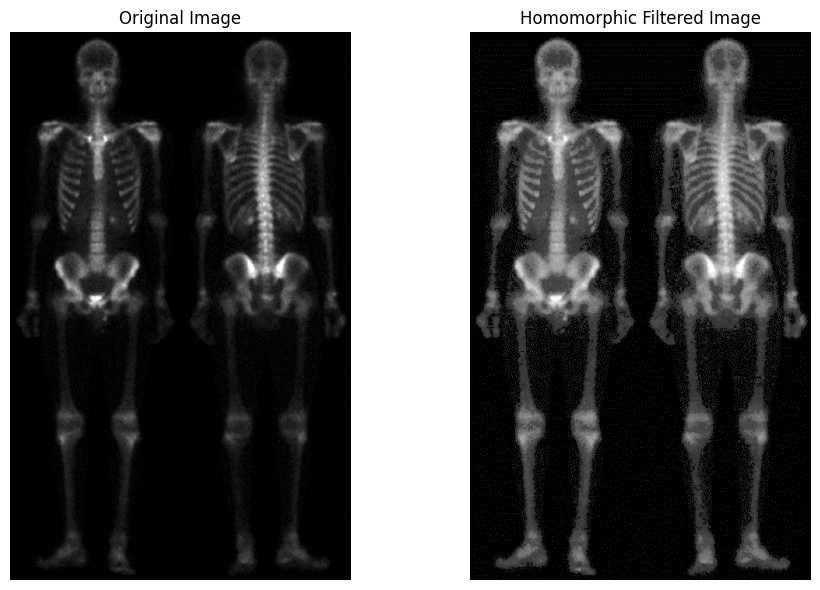

In [569]:
def applyHomomorphicFilter():
    # Read image
    img = cv2.imread('../images/IMG8.png', cv2.IMREAD_GRAYSCALE)

    # Apply homomorphic filter
    filtered_img = homomorphicFilter(img, sigma=30, gamma_low=0.5, gamma_high=1.5)

    # Plot original image and filtered image
    plt.figure(figsize=(10, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(filtered_img, cmap='gray')
    plt.title('Homomorphic Filtered Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

applyHomomorphicFilter()

### Homomorphic Filtering
- Homomorphic filtering is done to improve the appearance of an image by simultaneous intensity range compression and contrast enhancement.
- An image can be expressed as a product of its illumination(slow spatial variation) and reflectance(abrupt changes).
- We first take logartihm of image to take advantage of it being a product of illumination and reflectance.
- Next we take the fft of the logarithmic image and center it so that zero frequency forms the transform center
- Now we apply Gaussian filtering for blurring the image i.e intensity range compression in the transform domain.
- Now we take the inverse fft to get back to spacial domain
- Finally take exponential to get the original image back.
- The fact that illumination and reflectance are treated separately as low and high frequencies in transform domain helps maintain the overall structure while also blurring specific details to make them more visible and prominent.
- The values of gamma_low and gamma_high can help us control how much we want the low and high frequencies to appear in the final image.
- In above skeletons we can see how homomorphic filtering coloured the bones while maintaining the edges thus making the X-ray more readable and any fracture easilt identifiable as compared to the original image.


# You Can't See Me

In [570]:
# Read image
img = cv2.imread('../images/IMG9.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Extract RGB channels
R = img[:, :, 0]
G = img[:, :, 1]
B = img[:, :, 2]

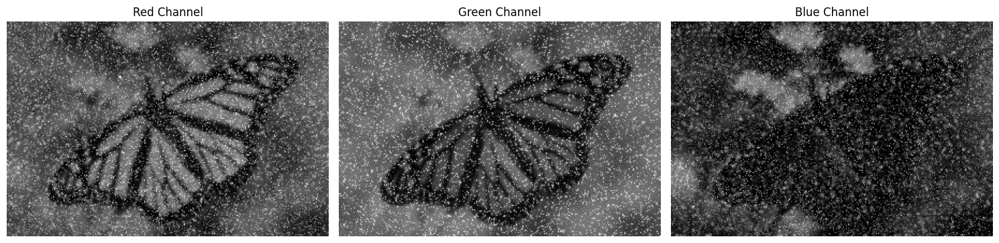

In [571]:
def visualise_channels_of_corrupted_image():
    # Plot each channel
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(R, cmap='gray')
    plt.title('Red Channel')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(G, cmap='gray')
    plt.title('Green Channel')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(B, cmap='gray')
    plt.title('Blue Channel')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

visualise_channels_of_corrupted_image()

- We can see from above that red and green channels have salt noise however blue channel has pepper noise as well.
- Thus we will use the median filter first.

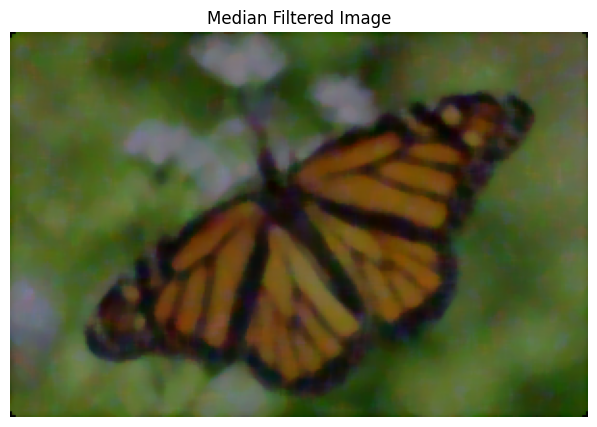

In [649]:
# Visualise salt noise removed from all channels

# Pass all channels to min filter one by one
green_filtered_median = medianFilter(G, k=7)
blue_filtered_median = medianFilter(B, k=7)
red_filtered_median = medianFilter(R, k=7)

# Stack filtered channels back into a color image
filtered_img_median = np.stack([red_filtered_median, green_filtered_median, blue_filtered_median], axis=2)

# Visualise these channels separately
plt.figure(figsize=(15, 5))
plt.imshow(filtered_img_median)
plt.title('Median Filtered Image')
plt.axis('off')

plt.show()

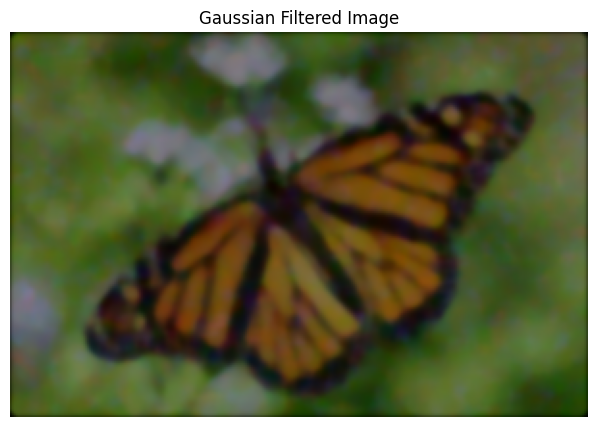

In [650]:
# Apply Gaussian Filter
green_filtered_gaussian = gaussFilter(green_filtered_median, sigma=1, k=5)
blue_filtered_gaussian = gaussFilter(blue_filtered_median, sigma=1, k=5)
red_filtered_gaussian = gaussFilter(red_filtered_median, sigma=1, k=5)

# Stack filtered channels back into a color image
filtered_img_gaussian = np.stack([red_filtered_gaussian, green_filtered_gaussian, blue_filtered_gaussian], axis=2)

# Plot
plt.figure(figsize=(15, 5))
plt.imshow(filtered_img_gaussian)
plt.title('Gaussian Filtered Image')
plt.axis('off')

plt.show()

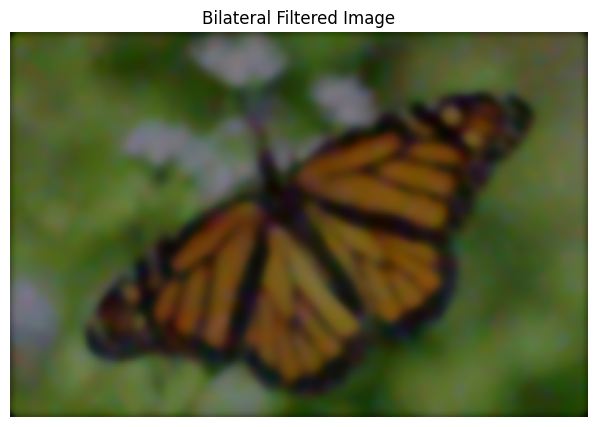

In [651]:
# Apply Bilateral filter to median filtered image
red_filtered_bilateral =  bilaterFilter(red_filtered_gaussian, k=5, sigma_s=2, sigma_r=50)
green_filtered_bilateral =  bilaterFilter(green_filtered_gaussian, k=5, sigma_s=2, sigma_r=50)
blue_filtered_bilateral = bilaterFilter(blue_filtered_gaussian, k=5, sigma_s=2, sigma_r=50)

# Stack filtered channels back into a color image
filtered_img = np.stack([red_filtered_bilateral, green_filtered_bilateral, blue_filtered_bilateral], axis=2)

# Plot
plt.figure(figsize=(15, 5))
plt.imshow(filtered_img)
plt.title('Bilateral Filtered Image')
plt.axis('off')

plt.show()

- We now see that the background and butterfly is very blurred. We need to use unsharp masking or high boost filtering to retain the structure and dynamics of the image.

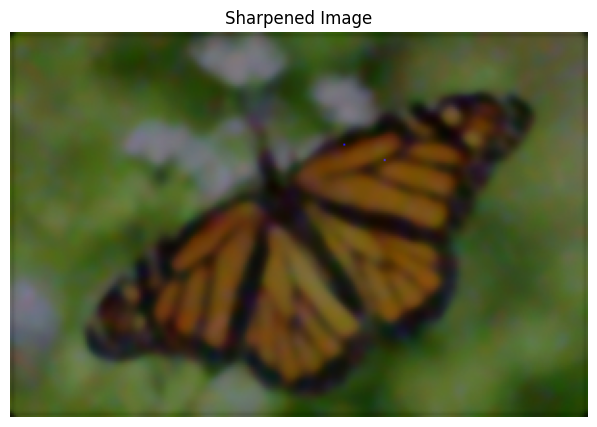

In [652]:
# Apply unsharp masking to the filtered image
sharpened_img_red = unsharpMask(red_filtered_bilateral, k=3, sigma=1)
sharpened_img_green = unsharpMask(green_filtered_bilateral, k=3, sigma=1)
sharpened_img_blue = unsharpMask(blue_filtered_bilateral, k=3, sigma=1)

# Stack sharpened channels back into a color image
sharpened_img = np.stack([sharpened_img_red, sharpened_img_green, sharpened_img_blue], axis=2)

# Plot image
plt.figure(figsize=(15, 5))
plt.imshow(sharpened_img)
plt.title('Sharpened Image')
plt.axis('off')

plt.show()

- We now increase the contrast to enhance the visibility of the image.

In [625]:
# Enhance contrast for above image
def change_contrast(pixels):
    # Change datatype to avoid overflow
    pixels = pixels.astype(np.uint16)

    # Set minimum and maximum intensities
    a_max = 255
    a_min = 0

    if len(pixels.shape) == 2:
        min_intensity, max_intensity = pixels.min(), pixels.max()
        pixels = (pixels - min_intensity) * (a_max - a_min) / (max_intensity - min_intensity) + a_min
        pixels_norm = np.clip(pixels, 0, 255).astype(np.uint8)
        reconstructed_img = pixels_norm

    else:
        # Extract RGB channels
        red_channel = pixels[:, :, 0]
        green_channel = pixels[:, :, 1]
        blue_channel = pixels[:, :, 2]

        # Compute minimum and maximum intensity for each channel
        red_min, red_max = red_channel.min(), red_channel.max()
        green_min, green_max = green_channel.min(), green_channel.max()
        blue_min, blue_max = blue_channel.min(), blue_channel.max()    

        # Modify the pixels for contrast streching
        red_channel = (red_channel-red_min)*(a_max-a_min)/(red_max-red_min) + a_min
        green_channel = (green_channel-green_min)*(a_max-a_min)/(green_max-green_min) + a_min
        blue_channel = (blue_channel-blue_min)*(a_max-a_min)/(blue_max-blue_min) + a_min

        # Clip the values to ensure they are between 0 and 255
        red_channel_norm = np.clip(red_channel, 0, 255).astype(np.uint8)
        green_channel_norm = np.clip(green_channel, 0, 255).astype(np.uint8)
        blue_channel_norm = np.clip(blue_channel, 0, 255).astype(np.uint8)

        # Reconstruct image using new RGB channels
        reconstructed_img = np.stack([red_channel_norm, green_channel_norm, blue_channel_norm], axis=-1)
    return reconstructed_img

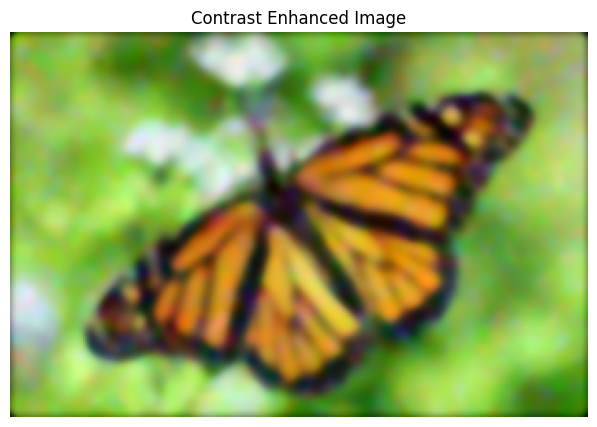

In [653]:
# Enahnce contrast
filtered_img = change_contrast(filtered_img)

# Visualise the image
plt.figure(figsize=(15, 5))
plt.imshow(filtered_img)
plt.title('Contrast Enhanced Image')
plt.axis('off')

plt.show()

### Image Processing Pipeline
- First we will remove noise from the image using median filter
- We can further free the image from any noise using gaussian and bilateral filter.
- Then to make the edges more prominent, use unsharp masking
- Finally add some contrast the image.